In [1]:
import scanpy as sc
import pandas as pd
# from scipy.io import mmread
import numpy as np
import scipy.sparse as sp
import os
import anndata as ad

# from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import scanpy.external as sce  # Harmony 在 sc.external
# from sklearn.decomposition import PCA
import harmonypy as hm
import warnings
warnings.simplefilter("ignore", category=pd.errors.PerformanceWarning)

In [3]:
adata = sc.read_h5ad("./adata_05a_with_embeddings.h5ad")
adata_aml = adata[adata.obs["category"].isin([1])].copy() ## only RR
adata_aml
# adata.obs = adata.obs.rename(columns={"patient": "individual"})

AnnData object with n_obs × n_vars = 23891 × 27187
    obs: 'prject', 'nUMI', 'nGene', 'cellID', 'Doublet_Score', 'Doublet_Class', 'log10GenesPerUMI', 'mitoRatio', 'riboRatio1', 'riboRatio2', 'riboRatio3', 'riboRatio4', 'riboRatio', 'RNA_snn_res.0', 'RNA_snn_res.0.1', 'RNA_snn_res.0.2', 'RNA_snn_res.0.3', 'RNA_snn_res.0.4', 'RNA_snn_res.0.5', 'RNA_snn_res.0.6', 'RNA_snn_res.0.7', 'RNA_snn_res.0.8', 'RNA_snn_res.0.9', 'RNA_snn_res.1', 'seurat_clusters', 'class1', 'sample', 'source', 'S.Score', 'G2M.Score', 'Phase', 'RNA_snn_res.1.2', 'RNA_snn_res.1.4', 'RNA_snn_res.1.6', 'RNA_snn_res.1.8', 'RNA_snn_res.2', 'cellType', 'dcellType', 'cell', 'patient', 'timing', 'category', 'response', 'sub.response', 'date', 'start', 'daysSinceStart', 'blast', 'age', 'sex', 'FAB', 'cellCount', 'monthsSinceStart', 'relapse', 'daysStartRelapse', 'monthsStartRelapse', 'azimuthNames', 'mut', 'p53.mut', 'n_counts', 'venetoclax', 'treat'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.varianc

In [4]:
adata.obs['patient'].value_counts()

patient
HCBM1    9828
Pt 15    9091
HCBM2    8549
HCBM3    4304
Pt 13    2723
Pt 12    2138
Pt 17    2131
Pt 11    1888
Pt 7     1735
Pt 14    1487
Pt 19    1441
Pt 21    1328
Pt 20     883
Pt 9      781
Pt 5      553
Pt 6      528
Pt 4      161
Pt 1       92
Name: count, dtype: int64

In [5]:
adata_aml = adata[adata.obs["category"].isin([1])].copy()
adata_aml.obs['patient'].value_counts()

patient
Pt 15    9091
Pt 13    2723
Pt 12    2138
Pt 17    2131
Pt 11    1888
Pt 14    1487
Pt 19    1441
Pt 21    1328
Pt 20     883
Pt 9      781
Name: count, dtype: int64

In [42]:
adata.obs['category'].value_counts()

category
1    23891
2    22681
0     3069
Name: count, dtype: int64

In [31]:
pd.crosstab(adata.obs['treat'], adata.obs["category"])

category,0,1,2
treat,,,
control,0,0,22681
post,416,9552,0
pre,2653,14339,0


In [51]:
pd.crosstab(adata.obs['treat'], adata.obs["timing"])


timing,0,1,2
treat,,,
control,0,0,27873
post,0,2753,0
pre,17766,0,0


In [50]:
hierarchical_markers = {
    "CD4": {
        # "general": ["CD4", "IL7R", "MAL", "LEF1", "LTB", "LDHB", "TPT1", "TRAC", "TCF7", "TMSB10", "LEPROTL1","CD3D", "CD3E","CD3G", "CD27"],   # broad CD4 T cell markers
         "general": ["CD4", "IL7R", "MAL", "LTB"],   # broad CD4 T cell markers
        "subtypes": {
            "CD4 Memory T cells": ["CXCR3", "IL7R", "LTB"],
            "CD4 Naive T cells": ["LEF1","TCF7","SELL","CD44"], #Naive "IL7R", "LTB"
            "CD4 CTL T cells": ["GZMB","PRF1","GNLY","NKG7"],
            "CD4 Exhausted T cells": ["CTLA4","LAG3","TIGIT","HAVCR2","PDCD1"],
            "CD4 Th1 T cells": ["TBX21","STAT4","IFNG","IL12A"],
            "CD4 Th2 T cells": ["STAT6","GATA6","IL4"],
            "CD4 Th17 T cells": ["IL7RA","STAT3","RORC"],
            "CD4 Tfh T cells": ["BCL6","CXCR5"],
            "Treg": ["TGFB1","FOXP3","IL2RA","IKZF2"]
        }
    },
    "CD8": {
        # "general": ["CD8A","CD8B","NELL2", "CD3D", "CD3E", "S100B", "GZMH", "CD3G", "TRGC2", "CCL5"],
        "general": ["CD8A","CD8B", "CD3D" ],
        "subtypes": {
            "CD8 Naive T cells": ["NELL2","CD8B","CCR7","LEF1","SELL","IL7R"],
            "CD8 Effector Memory T cells": ["PRF1","FGFBP2","FCGR3A","KLRD1","NKG7","KLRG1","CX3CR1"],
            "CD8 Exhausted T cells": ["CTLA4","LAG3","TIGIT","PDCD1","TOX"],
            "CD8 CTL T cells": ["GZMB","PRF1","GNLY","NKG7","GZMA"],
            "MAIT": ["KLRB1","IL7R","SLC4A10","RORC"]
        }
    },
    # "B": {
    #     "general": ["FCRL1", "FCRL2", "CD22", "ARHGAP24", #Azimuth
    #                                                            "BANK1", "MS4A1", "RALGPS2", "CD37",
    #                                                            "SWAP70", "CD79A",
    #                                                            "CD19", "B220"],#Abbas Lab
    #     "subtypes": {}
    # },
    "B": {
        "general": ["MS4A1", "CD79A", "CD79B", "BANK1", "RALGPS2"],
        "subtypes": {
            "B intermediate": ["MS4A1", "TNFRSF13B", "IGHM", "IGHD", "AIM2", "CD79A", "LINC01857", "RALGPS2", "BANK1", "CD79B"],
            "B memory": ["MS4A1", "COCH", "AIM2", "BANK1", "SSPN", "CD79A", "TEX9", "RALGPS2", "TNFRSF13C", "LINC01781"],
            "B naive": ["IGHM", "IGHD", "CD79A", "IL4R", "MS4A1", "CXCR4", "BTG1", "TCL1A", "CD79B", "YBX3"],
            "Plasmablast": ["IGHA2", "MZB1", "TNFRSF17", "DERL3", "TXNDC5", "TNFRSF13B", "POU2AF1", "CPNE5", "HRASLS2", "NT5DC2"]
        }
    },

    "pre B": {
        "general": ["NPY", "LCN6", "RAG2", "HMHB1",
                                                               "ARPP21", "AKAP12", "RAG1", "C10orf10",
                                                               "CYGB", "SLC8A1-AS1"],#Abbas Lab
        "subtypes": {}
    },

    # ---- Myeloid / Mono / Macrophage ----
    "Mono": {
        "general": ["LYPD2", "FOLR3", "CLEC4E", "LILRA1",
                    "CDA", "RBP7", "CD300LF", "FPR1", "CD93", "MTMR11"],
        "subtypes": {
            "CD14 Mono": ["FOLR3", "CLEC4E", "MCEMP1", "RBP7",
                          "CDA", "FPR1", "CD300E", "C5AR1",
                          "CD93", "APOBEC3A"],
            "CD16 Mono": ["LYPD2", "VMO1", "TPPP3", "C1QA",
                          "C5AR1", "CD300E", "GPBAR1", "LILRA1",
                          "HES4", "APOBEC3A"]
        }
    },
    # ===== NK lineage =====
    "NK": {
        "general": ["TRDC", "FCER1G", 
                    "KLRF1" 
                    ],
        # "general": ["NKG7", "KLRC1", "KLRD1", "KLRB1", 
        #                                                        "KIR2DL1", "KIR3DL1", "KIR2DL3", "KIR3DL2",
        #                                                        "KIR3DL3", "GNLY", "NCAM1", "FCGR3A"],
        "subtypes": {
            "NK CD56-dim": ["GNLY", "TYROBP", "NKG7", "GZMB",  "PRF1", "FGFBP2", "SPON2"],
            "NK Proliferating": ["MKI67" , "TYMS",  "TOP2A", "PCLAF", "CD247", "CLSPN", "ASPM"],
            "NK CD56-bright": ["XCL2",  "SPINK2", "KLRC1", "XCL1", "SPTSSB", "PPP1R9A", "NCAM1", "TNFRSF11A"]
        }
    },
    "EMPs": {
        "general": ["MYCT1", "CRHBP", "NPR3", "AVP", "HPGDS", "CRYGD","IGSF10", "PBX1", 
                    "CYTL1","GATA2"
                    ],
        
        "subtypes": {
            "Megakaryocyte": [
                "GFI1B", "SELP", "GP1BA", "CD9", "ITGA2B", "GATA2", "FLI1",
                "GP1BB", "VWF", "THPO", "ELF1", "THBS1", "MPIG6B", "GP9",
                "F2R", "FOG1", "NFE2", "SPI1", "PF4"
            ],
            "Erythroid progenitor": [
                "GATA1", "KLF1", "FCER1A", "ITAG2B", "EPOR", "HBD", "ZFPM1",
                "GATA2", "GYPA", "TFRC", "TFR2", "CSF2RB", "APOE", "APOC1",
                "CNRIP1", "FOXO3", "ETS1", "BRD1", "TAL1"
            ]
        }
    },

    # ---- DC ----
    "DC": {
        "general": ["CLEC4C", "PROC", "SCT", "SCN9A",
                    "SHD", "PPM1J", "ENHO", "CLEC10A",
                    "LILRA4", "DNASE1L3"],
        "subtypes": {
            'ASDC':['PPP1R14A', 'LILRA4', 'AXL', 'IL3RA', 'SCT', 'SCN9A', 'LGMN', 'DNASE1L3', 'CLEC4C', 'GAS6'],
            'cDC1':['CLEC9A', 'DNASE1L3', 'C1orf54', 'IDO1', 'CLNK', 'CADM1', 'FLT3', 'ENPP1', 'XCR1', 'NDRG2'],
            'cDC2':['FCER1A', 'HLA-DQA1', 'CLEC10A', 'CD1C', 'ENHO', 'PLD4', 'GSN', 'SLC38A1', 'NDRG2', 'AFF3'],
            'pDC':['ITM2C', 'PLD4', 'SERPINF1', 'LILRA4', 'IL3RA', 'TPM2', 'MZB1', 'SPIB', 'IRF4', 'SMPD3']
        }
    },

    # ---- Progenitors / Stem cells ----
    "HSC": {
        "general": ["CD34", "AVP", "CRHBP"],
        "subtypes": {}
    },
    "CLP": {
        "general": ["ACY3", "PRSS2", "C1QTNF4", "SPINK2",
                    "SMIM24", "NREP", "CD34", "DNTT", "FLT3", "SPNS3"],
        "subtypes": {}
    },
    "GMP": {
        "general": ["SERPINB10", "RNASE3", "MS4A3", "PRTN3",
                    "ELANE", "AZU1", "CTSG", "RNASE2", "RETN", "NPW"],
        "subtypes": {}
    },

    # ---- Erythroid / Megakaryocyte ----
    # "Early Erythroid": {
    #     "general": [
    #         "CNRIP1",  "ITGA2B", "TFR2", "MAP7", "FSCN1", "APOC1" "GATA1", "KLF1", 
    #                 "CYTL1","GATA2",
    #                 ],
    #     "subtypes": {}
    # },
    # "Late Erythroid": {
    #     "general": ["CTSE", "TSPO2", "IFIT1B", "TMEM56",
    #                            "RHCE", "RHAG", "SPTA1", "ADD2",
    #                            "EPCAM", "HBG1"],
    #     "subtypes": {}
    # },
    "Macrophage": {
        "general": ["SPIC", "FABP3", "CD5L", "CCL18",
                    "C1QC", "C1QB", "FABP4", "C1QA",
                    "APOE", "SELENOP"],
        "subtypes": {}
    },
    "Erythroid": {
        "general": ['HBD', 'HBM', 'AHSP', 'ALAS2','CA1', 'SLC4A1', 'IFIT1B', 'TRIM58', 'SELENBP1', 'TMCC2'],
        "subtypes": {
            "Early Erythroid": ["CNRIP1", "GATA2", "ITGA2B", "TFR2",
                                "GATA1", "KLF1", "CYTL1", "MAP7",
                                "FSCN1", "APOC1"],
            "Late Erythroid": ["CTSE", "TSPO2", "IFIT1B", "TMEM56",
                               "RHCE", "RHAG", "SPTA1", "ADD2",
                               "EPCAM", "HBG1"]
        }
    },
    "Platelets": {
        "general": ["RGS18", "C2orf88", "TMEM40", "GP9",
                    "PF4", "PPBP", "DAB2", "SPARC",
                    "RUFY1", "F13A1"],
        "subtypes": {}
    }
}

In [54]:
celltype_colors_dict = {
    # ---- CD4 T ----
    "CD4": "#8dd3c7",
    "CD4 Memory T cells": "#66c2a5",
    "CD4 Naive T cells": "#99d8c9",
    "CD4 CTL T cells": "#41ae76",
    "CD4 Exhausted T cells": "#238b45",
    "CD4 Th1 T cells": "#005824",
    "CD4 Th2 T cells": "#b2e2e2",
    "CD4 Th17 T cells": "#7bccc4",
    "CD4 Tfh T cells": "#2ca25f",
    "Treg": "#006d2c",

    # ---- CD8 T ----
    "CD8": "#fb8072",
    "CD8 Naive T cells": "#fdbb84",
    "CD8 Effector Memory T cells": "#e34a33",
    "CD8 Exhausted T cells": "#b30000",
    "CD8 CTL T cells": "#f16913",
    "MAIT": "#fb6a4a",

    # ---- B cells ----
    "B": "#80b1d3",
    "B intermediate": "#4eb3d3",
    "B memory": "#2b8cbe",
    "B naive": "#7fcdbb",
    "Plasmablast": "#1c9099",

    # ---- pre B ----
    "pre B": "#08306b",

    # ---- Monocytes ----
    "Mono": "#bebada",
    "CD14 Mono": "#9e9ac8",
    "CD16 Mono": "#756bb1",

    # ---- NK ----
    "NK": "#fccde5",
    "NK CD56-dim": "#fa9fb5",
    "NK Proliferating": "#dd3497",
    "NK CD56-bright": "#980043",

    # ---- EMPs ----
    # ---- EMPs ----
    "EMPs": "#fdb462", 
    "Megakaryocyte": "#f47c3c",
    "Erythroid progenitor": "#fed98e",

    # ---- DC ----
    "DC": "#b3de69",
    "ASDC": "#66c2a5",
    "cDC1": "#31a354",
    "cDC2": "#006d2c",
    "pDC": "#b2df8a",

    # ---- Progenitors / Stem cells ----
    "HSC": "#bc80bd",
    "CLP": "#8c6bb1",
    "GMP": "#88419d",

    # ---- Macrophage ----
    "Macrophage": "#ffed6f",

    # ---- Erythroid ----
    "Erythroid": "#d9d9d9",
    "Early Erythroid": "#bdbdbd",
    "Late Erythroid": "#969696",

    # ---- Platelets ----
    "Platelets": "#a6cee3",

    # ---- Default ----
    "Unknown": "#999999"
}

# plt.figure(figsize=(8, 12))
# plt.axis("off")
# patches = [mpatches.Patch(color=color, label=ctype) for ctype, color in celltype_colors_dict.items()]

# plt.legend(
#     handles=patches,
#     loc='center left',
#     bbox_to_anchor=(0, 0, 1, 1),  # 左对齐，居中
#     ncol=2,                       # 分两列显示
#     fontsize=9,
#     title="Cell Type Color Legend",
#     title_fontsize=11,
#     frameon=False
# )

# plt.tight_layout()
# plt.show()
# plt.savefig("celltype_color_legend.png", dpi=300, bbox_inches="tight")


In [8]:
def main_cluster(adata_filter, n_neighbors, embs,resolution,threshold_main,threshold_sub,celltype_colors_dict):
    # for key in ['X_harmony', 'X_pca', 'X_tsne', 'X_pca_harmony']:
    #     adata_filter.obsm.pop(key, None)

    # Z = adata_filter.obsm[embs]
    # Z = Z.toarray() if hasattr(Z, 'toarray') else Z  # 转为 dense

    # ho = hm.run_harmony(Z, adata_filter.obs, vars_use=['patient'])
    # # harmonypy 返回是 (dims x cells)，所以转置
    # adata_filter.obsm[f'{embs}_harmony'] = ho.Z_corr.T

    sce.pp.harmony_integrate(adata_filter, key="patient", basis=embs)
    sc.pp.neighbors(adata_filter, use_rep=f'X_harmony', n_neighbors=n_neighbors)
    sc.tl.leiden(adata_filter, resolution=resolution)
    # ari3 = adjusted_rand_score(adata_filter.obs["dcellType"], adata_pre.obs["leiden"])
    # print("Harmony on embedding ARI:", ari3)
    cluster_annotations = {}
    cluster_topN = {}

    sc.tl.rank_genes_groups(adata_filter, 'leiden', method='wilcoxon')

    cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()
    cluster_means = (cluster_means - cluster_means.mean()) / cluster_means.std()
    for cluster in cluster_means.index:
        lineage_scores = {}
        
        # ---- broad lineage ----
        for lineage, info in hierarchical_markers.items():
            general_markers = [g for g in info["general"] if g in cluster_means.columns]
            if not general_markers:
                continue
            lineage_scores[lineage] = cluster_means.loc[cluster, general_markers].mean()
        
        if not lineage_scores:
            cluster_annotations[cluster] = "Unknown"
            continue
        best_lineage, best_lineage_score = max(lineage_scores.items(), key=lambda x: x[1])
        
        if best_lineage_score < threshold_main:
            cluster_annotations[cluster] = "Unknown"
            continue
        
        # ---- sub ----
        subtype_scores = {}
        subtypes = hierarchical_markers[best_lineage]["subtypes"]
        
        if subtypes:
            for subtype, markers in subtypes.items():
                markers_in_data = [g for g in markers if g in cluster_means.columns]
                if not markers_in_data:
                    continue
                subtype_scores[subtype] = cluster_means.loc[cluster, markers_in_data].mean()
        
        if not subtype_scores:
            cluster_annotations[cluster] = best_lineage
        else:
            best_subtype, best_sub_score = max(subtype_scores.items(), key=lambda x: x[1])
            if best_sub_score >= threshold_sub:
                cluster_annotations[cluster] = best_subtype
            else:
                cluster_annotations[cluster] = best_lineage
        
        cluster_topN[cluster] = {
            "lineage": (best_lineage, best_lineage_score),
            "lineage_scores": lineage_scores,  
            "top_subtypes": sorted(subtype_scores.items(), key=lambda x: x[1], reverse=True)[:3]
    }

    adata_filter.obs['celltype'] = adata_filter.obs['leiden'].map(cluster_annotations)
    adata_filter.obs['celltype'] = adata_filter.obs['celltype'].astype('category')
    # adata_filter.uns['celltype_colors'] = [
    #     celltype_colors_dict.get(c, "#CCCCCC")  
    #     for c in adata_filter.obs['celltype'].cat.categories
    #     ]
    topN_summary = pd.DataFrame({
        k: {
            **{
                f"main_type_{i+1}": sorted(v["lineage_scores"].items(), key=lambda x: x[1], reverse=True)[i][0]
                if len(v["lineage_scores"]) > i else None
                for i in range(3)
            },
            **{
                f"main_score_{i+1}": sorted(v["lineage_scores"].items(), key=lambda x: x[1], reverse=True)[i][1]
                if len(v["lineage_scores"]) > i else None
                for i in range(3)
            }
        }
        for k, v in cluster_topN.items()
    }).T

    return adata_filter, cluster_topN, topN_summary 

In [ ]:
adata_results = {}
cluster_topNs = {}
topN_summaries = {}
treatments = ["pre", "post"]
responses = ["responder", "nonresponder"]

embs = "X_embedding_V2-104M"
n_neighbors = 10
threshold_main = 0.1
threshold_sub = 0.1


for treatment in treatments:
    for response in responses:

        print(f"\n=== Running: {treatment} | {response} ===")

        # resolution 规则
        if treatment == "pre" and response == "responder":
            resolution = 3.0
        else:
            resolution = 5.0

        # ===============================
        # 数据过滤
        # ===============================
        adata_filter = adata_aml[adata_aml.obs['treat'] == treatment].copy()
        adata_filter = adata_filter[adata_filter.obs['venetoclax'] == response].copy()

        print(f"Cells: {adata_filter.n_obs}")

        # ===============================
        # 主分析
        # ===============================
        adata_result, cluster_topN, topN_summary = main_cluster(
            adata_filter,
            n_neighbors,
            embs,
            resolution,
            threshold_main,
            threshold_sub,
            celltype_colors_dict
        )

        # ===============================
        # 动态命名 key
        # ===============================
        key = f"{treatment}_{response}"

        adata_results[key] = adata_result
        cluster_topNs[key] = cluster_topN
        topN_summaries[key] = topN_summary
        
os.makedirs("results/adata", exist_ok=True)

for key, ad in adata_results.items():
    ad.write(f"results/adata/adata_result_{key}.h5ad")
import pickle    
os.makedirs("results/topN", exist_ok=True)

# ---- cluster_topN (dict → pickle) ----
for key, d in cluster_topNs.items():
    with open(f"results/topN/cluster_topN_{key}.pkl", "wb") as f:
        pickle.dump(d, f)

# ---- topN_summary (DataFrame → csv) ----
for key, df in topN_summaries.items():
    df.to_csv(f"results/topN/topN_summary_{key}.csv", index=True)

In [24]:
import os
import pickle
import pandas as pd

# ========= 你已有的函数（保持不变） =========
def get_cluster_proportions(adata, cluster_key='leiden'):
    s = adata.obs[cluster_key].astype('category').cat.remove_unused_categories()
    counts = s.value_counts()
    props  = (counts / counts.sum())
    out = pd.DataFrame({
        'n_cells': counts.sort_index(),
        'prop': props.sort_index(),
        'percent': (props.sort_index() * 100).round(2)
    })
    try:
        out = out.sort_index(key=lambda idx: idx.astype(int))
    except Exception:
        pass
    return out


# ===============================
# 结果容器
# ===============================
adata_results = {}
cluster_topNs = {}
topN_summaries = {}

leiden_props = {}
topN_summary_subs = {}
cross_tabs = {}

treatments = ["pre", "post"]
responses = ["responder", "nonresponder"]

embs = "X_embedding_V2-104M"
n_neighbors = 10
threshold_main = 0.1
threshold_sub = 0.1


# ===============================
# 主循环（只计算，不保存）
# ===============================
for treatment in treatments:
    for response in responses:

        print(f"\n=== Running: {treatment} | {response} ===")

        resolution = 3.0 if (treatment == "pre" and response == "responder") else 5.0

        adata_filter = adata_aml[adata_aml.obs["treat"] == treatment].copy()
        adata_filter = adata_filter[adata_filter.obs["venetoclax"] == response].copy()

        print(f"Cells: {adata_filter.n_obs}")
        if adata_filter.n_obs == 0:
            print("Skip (no cells).")
            continue

        adata_result, cluster_topN, topN_summary = main_cluster(
            adata_filter,
            n_neighbors,
            embs,
            resolution,
            threshold_main,
            threshold_sub,
            celltype_colors_dict
        )

        key = f"{treatment}_{response}"

        # ---- 主输出 ----
        adata_results[key] = adata_result
        cluster_topNs[key] = cluster_topN          # dict
        topN_summaries[key] = topN_summary         # df

        # ---- 你新增的 3 个输出 ----
        # 1) leiden proportions
        leiden_props[key] = get_cluster_proportions(adata_result, "leiden")

        # 2) topN_summary_sub (df from dict)
        topN_summary_subs[key] = pd.DataFrame({
            k: {
                "lineage": v["lineage"][0],
                "lineage_score": v["lineage"][1],
                **{f"subtype_{i+1}": v["top_subtypes"][i][0] if len(v["top_subtypes"]) > i else None for i in range(3)},
                **{f"subtype_score_{i+1}": v["top_subtypes"][i][1] if len(v["top_subtypes"]) > i else None for i in range(3)},
            }
            for k, v in cluster_topN.items()
        }).T

        # 3) leiden × celltype crosstab
        cross_tabs[key] = pd.crosstab(
            adata_result.obs["leiden"],
            adata_result.obs["celltype"],
            normalize="index"
        ).round(3)


# ===============================
# 循环结束后统一保存
# ===============================
os.makedirs("results/adata", exist_ok=True)
os.makedirs("results/topN", exist_ok=True)

# ---- adata ----
for key, ad in adata_results.items():
    ad.write(f"results/adata/adata_result_{key}.h5ad")

# ---- cluster_topN (dict → pickle) ----
for key, d in cluster_topNs.items():
    with open(f"results/topN/cluster_topN_{key}.pkl", "wb") as f:
        pickle.dump(d, f)

# ---- topN_summary ----
for key, df in topN_summaries.items():
    df.to_csv(f"results/topN/topN_summary_{key}.csv", index=True)

# ---- leiden_prop ----
for key, df in leiden_props.items():
    df.to_csv(f"results/topN/leiden_prop_{key}.csv", index=True)

# ---- topN_summary_sub ----
for key, df in topN_summary_subs.items():
    df.to_csv(f"results/topN/topN_summary_sub_{key}.csv", index=True)

# ---- cross_tab ----
for key, df in cross_tabs.items():
    df.to_csv(f"results/topN/leiden_celltype_crosstab_{key}.csv", index=True)

print("\nAll saved under: results/adata and results/topN")



=== Running: pre | responder ===


2025-12-21 20:46:11,734 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Cells: 4365


2025-12-21 20:46:13,620 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-12-21 20:46:13,645 - harmonypy - INFO - Iteration 1 of 10
2025-12-21 20:46:15,020 - harmonypy - INFO - Iteration 2 of 10
2025-12-21 20:46:16,287 - harmonypy - INFO - Iteration 3 of 10
2025-12-21 20:46:17,556 - harmonypy - INFO - Converged after 3 iterations
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\3554219977.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()



=== Running: pre | nonresponder ===


2025-12-21 20:46:23,765 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Cells: 12627


2025-12-21 20:46:29,260 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-12-21 20:46:29,328 - harmonypy - INFO - Iteration 1 of 10
2025-12-21 20:46:33,131 - harmonypy - INFO - Iteration 2 of 10
2025-12-21 20:46:36,745 - harmonypy - INFO - Iteration 3 of 10
2025-12-21 20:46:40,384 - harmonypy - INFO - Converged after 3 iterations
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\3554219977.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()



=== Running: post | responder ===


2025-12-21 20:46:55,387 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Cells: 5986


2025-12-21 20:46:58,116 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-12-21 20:46:58,143 - harmonypy - INFO - Iteration 1 of 10
2025-12-21 20:47:00,051 - harmonypy - INFO - Iteration 2 of 10
2025-12-21 20:47:01,857 - harmonypy - INFO - Iteration 3 of 10
2025-12-21 20:47:03,698 - harmonypy - INFO - Converged after 3 iterations
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\3554219977.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()



=== Running: post | nonresponder ===


2025-12-21 20:47:11,604 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Cells: 3982


2025-12-21 20:47:13,330 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-12-21 20:47:13,352 - harmonypy - INFO - Iteration 1 of 10
2025-12-21 20:47:14,585 - harmonypy - INFO - Iteration 2 of 10
2025-12-21 20:47:15,730 - harmonypy - INFO - Iteration 3 of 10
2025-12-21 20:47:16,881 - harmonypy - INFO - Converged after 3 iterations
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\3554219977.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()



All saved under: results/adata and results/topN


In [43]:

for treatment in treatments:
    for response in responses:
        key = f"{treatment}_{response}"
        print(key)
        adata_result = adata_results[key].copy()
        # 确保 leiden 是字符串
        adata_result.obs['leiden'] = adata_result.obs['leiden'].astype(str)

        # 输出目录
        outdir = f"./umap_{treatment}_{response}"
        os.makedirs(outdir, exist_ok=True)


        adata_result.uns['celltype_colors'] = [
            celltype_colors_dict.get(c, "#CCCCCC")  # 若未定义则灰色
            for c in adata_result.obs['celltype'].cat.categories
        ]


        # =========================
        # B) 全局 UMAP：leiden（on data）
        # =========================
        sc.pl.umap(
            adata_result,
            color="leiden",
            legend_loc="on data",
            size=20,
            legend_fontsize=9,
            legend_fontoutline=1,
            title=f"Leiden {treatment}_{response}",
            show=False
        )
        plt.savefig(f"{outdir}/UMAP_leiden.png", dpi=300, bbox_inches="tight")
        plt.close()

        # =========================
        # C) 全局 UMAP：celltype（on data） + celltype（无图例）
        # =========================
        if "celltype" in adata_result.obs:
            sc.pl.umap(
                adata_result,
                color="celltype",
                legend_loc="on data",
                size=20,
                legend_fontsize=9,
                legend_fontoutline=1,
                title=f"Celltype {treatment}_{response}",
                show=False
            )
            plt.savefig(f"{outdir}/UMAP_celltype_ondata.png", dpi=300, bbox_inches="tight")
            plt.close()

            sc.pl.umap(
                adata_result,
                color="celltype",
                legend_loc=None,   # 不显示文字图例
                size=20,
                title=f"Celltype (no legend) {treatment}_{response}",
                show=False
            )
            plt.savefig(f"{outdir}/UMAP_celltype_nolegend.png", dpi=300, bbox_inches="tight")
            plt.close()

            # =========================
            # D) 一张图里同时保存 leiden + celltype（scanpy 会做成两个 panel）
            # =========================
            sc.pl.umap(
                adata_result,
                color=["leiden", "celltype"],
                legend_loc="on data",
                size=20,
                legend_fontsize=9,
                legend_fontoutline=1,
                show=False
            )
            plt.savefig(f"{outdir}/UMAP_leiden_celltype.png", dpi=300, bbox_inches="tight")
            plt.close()



        # 所有 cluster
        clusters = sorted(adata_result.obs['leiden'].unique())

        print(f"Total clusters: {len(clusters)}")
        print(clusters)


        X = adata_result.obsm["X_umap"]
        xmin, xmax = X[:,0].min(), X[:,0].max()
        ymin, ymax = X[:,1].min(), X[:,1].max()



        for cl in clusters:
            # print(f"Plotting cluster {cl} ...")

            # 新建一列：只保留当前 cluster
            adata_result.obs['leiden_only'] = None
            adata_result.obs.loc[
                adata_result.obs['leiden'] == cl, 'leiden_only'
            ] = cl

            # 画图并保存
            sc.pl.umap(
                adata_result,
                color='leiden_only',
                # legend_loc='on data',
                legend_loc=None,
                size=20,
                legend_fontsize=10,
                legend_fontoutline=1,
                title="",
                # title=f"Leiden cluster {treatrment}_{response}_{cl}",
                show=False
            )
            ax = plt.gca()
            ax.set_xlim(xmin, xmax)
            ax.set_ylim(ymin, ymax)
            ax.set_axis_off()
            plt.savefig(f"{outdir}/UMAP_leiden_{cl}.png", dpi=300, bbox_inches="tight")
            plt.close()


pre_responder
Total clusters: 33
['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', '32', '4', '5', '6', '7', '8', '9']
pre_nonresponder
Total clusters: 61
['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '4', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '5', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '6', '60', '7', '8', '9']
post_responder
Total clusters: 66
['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '4', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '5', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '6', '60', '61', '62

In [49]:

import re
from PIL import Image

selected_clusters = {
    "pre_responder": ['11','12','14','16','18','19','2','21','23','24','26','28','31','4','5','6'],
    "pre_nonresponder": ['25','29','30','35','36','53','6'],
    "post_responder": ['9','32','64'],
    "post_nonresponder": ['0','1','2','4','9','13','18','21','24','37','38','39','40','45','54']
}

UMAP_DIR_PATTERN = "./umap_{treatment}_{response}/BC/"
ANNOT_CSV_PATTERN = "results/topN/topN_summary_sub_{treatment}_{response}.csv"

In [52]:

def image_to_mask(img_path, blue_margin=40, min_blue=80, min_alpha=10):
    """
    把 UMAP png 转成二值 mask，只保留“蓝色点”的像素：
      1 = 蓝色点像素
      0 = 其他（灰点/白底/文字/透明）

    判定逻辑（比 HSV 更稳）：
      - B 通道要足够高
      - B 要显著大于 R 和 G
      - alpha 需要>min_alpha
    """
    img = Image.open(img_path).convert("RGBA")
    arr = np.array(img)

    R = arr[..., 0].astype(np.int16)
    G = arr[..., 1].astype(np.int16)
    B = arr[..., 2].astype(np.int16)
    A = arr[..., 3].astype(np.int16)

    mask = (
        (A > min_alpha) &
        (B > min_blue) &
        (B - R > blue_margin) &
        (B - G > blue_margin)
    )

    return mask.astype(np.uint8)


def mask_dice(a, b):
    inter = np.logical_and(a, b).sum()
    denom = a.sum() + b.sum()
    return (2 * inter) / denom if denom else 0.0

def mask_iou(a, b):
    inter = np.logical_and(a, b).sum()
    union = np.logical_or(a, b).sum()
    return inter / union if union else 0.0

def resize_mask_to(m, shape_hw):
    im = Image.fromarray((m * 255).astype(np.uint8)).resize((shape_hw[1], shape_hw[0]), resample=Image.NEAREST)
    return (np.array(im) > 0).astype(np.uint8)

# =========================
# C) 读取 topN_summary_sub_{treat}_{resp}.csv
#    输出：cluster(str) -> celltype(str)
# =========================
def load_cluster_celltype_map(treatment, response, prefer="lineage"):
    """
    prefer:
      - "lineage"：优先用 lineage
      - "subtype_1"：优先用 subtype_1
      - "lineage_then_subtype"：lineage 不存在就用 subtype_1
    """
    path = ANNOT_CSV_PATTERN.format(treatment=treatment, response=response)
    df = pd.read_csv(path, index_col=0)
    df.index = df.index.astype(str)  # cluster id as str

    def pick(row):
        lin = row.get("lineage", None)
        st1 = row.get("subtype_1", None)
        if prefer == "lineage":
            return lin
        if prefer == "subtype_1":
            return st1
        # lineage_then_subtype
        return lin if pd.notna(lin) else st1

    mapping = {cl: pick(df.loc[cl]) if cl in df.index else None for cl in df.index}
    return mapping

# =========================
# D) 加载某个条件下指定 cluster 的 masks
# =========================
def load_condition_masks(cond_key, clusters):
    treatment, response = cond_key.split("_", 1)  # "pre_responder" -> ("pre","responder")
    umap_dir = UMAP_DIR_PATTERN.format(treatment=treatment, response=response)

    masks = {}
    for cl in clusters:
        img_path = os.path.join(umap_dir, f"UMAP_leiden_{cl}.png")
        if not os.path.exists(img_path):
            raise FileNotFoundError(f"Missing image: {img_path}")
        masks[str(cl)] = image_to_mask(img_path)
    return masks

# =========================
# E) 计算两个条件之间的相似度矩阵 + TopK 匹配长表
# =========================
def compare_conditions(condA, condB, metric="dice", topk=5, prefer_celltype="lineage_then_subtype"):
    treatA, respA = condA.split("_", 1)
    treatB, respB = condB.split("_", 1)

    # cluster 列表
    clustersA = [str(x) for x in selected_clusters[condA]]
    clustersB = [str(x) for x in selected_clusters[condB]]

    # celltype map
    mapA = load_cluster_celltype_map(treatA, respA, prefer=prefer_celltype)
    mapB = load_cluster_celltype_map(treatB, respB, prefer=prefer_celltype)

    # masks
    masksA = load_condition_masks(condA, clustersA)
    masksB = load_condition_masks(condB, clustersB)

    # 统一尺寸（如果尺寸不一致，说明导图时 bbox/legend/title 影响了）
    target_shape = next(iter(masksA.values())).shape
    for k in list(masksA.keys()):
        if masksA[k].shape != target_shape:
            masksA[k] = resize_mask_to(masksA[k], target_shape)
    for k in list(masksB.keys()):
        if masksB[k].shape != target_shape:
            masksB[k] = resize_mask_to(masksB[k], target_shape)

    # similarity matrix
    sim = pd.DataFrame(index=clustersA, columns=clustersB, dtype=float)
    scorer = mask_dice if metric == "dice" else mask_iou

    for ca in clustersA:
        for cb in clustersB:
            sim.loc[ca, cb] = scorer(masksA[ca], masksB[cb])

    # long-form topK matches
    rows = []
    for ca in clustersA:
        s = sim.loc[ca].sort_values(ascending=False)
        for rank, (cb, val) in enumerate(s.head(topk).items(), start=1):
            rows.append({
                "condA": condA,
                "clusterA": ca,
                "celltypeA": mapA.get(ca, None),
                "condB": condB,
                "clusterB": cb,
                "celltypeB": mapB.get(cb, None),
                "metric": metric,
                "score": float(val),
                "rank": rank
            })
    matches = pd.DataFrame(rows).sort_values(["condA","clusterA","rank"])

    return sim, matches

# =========================
# F) 批量跑你关心的比较
# =========================
outdir = "results/pixel_similarity"
os.makedirs(outdir, exist_ok=True)

pairs_to_compare = [
    ("pre_responder", "pre_responder"),
    ("pre_nonresponder", "pre_nonresponder"),
    ("post_nonresponder", "post_nonresponder"),
    ("post_responder", "post_responder"),
    
    ("pre_responder", "pre_nonresponder"),
    ("pre_responder", "post_responder"),
    ("pre_responder", "post_nonresponder"),
    ("pre_nonresponder", "post_responder"),
    ("pre_nonresponder", "post_nonresponder"),
    ("post_responder", "post_nonresponder"),
]

all_matches = []
for a, b in pairs_to_compare:
    sim, matches = compare_conditions(a, b, metric="dice", topk=5, prefer_celltype="lineage_then_subtype")
    sim.to_csv(f"{outdir}/sim_{a}_VS_{b}_dice.csv")
    matches.to_csv(f"{outdir}/matches_{a}_VS_{b}_dice_top5.csv", index=False)
    all_matches.append(matches)

pd.concat(all_matches, ignore_index=True).to_csv(f"{outdir}/ALL_matches_dice_top5.csv", index=False)

print(f"Done. Outputs saved under: {outdir}")


Done. Outputs saved under: results/pixel_similarity


In [55]:

def image_to_mask(img_path, blue_margin=40, min_blue=80, min_alpha=10):
    """
    Convert UMAP png into a binary mask keeping ONLY 'blue' pixels:
      1 = blue pixels
      0 = everything else (grey points / background / text / transparent)

    Robust rule (works well for Scanpy-like plots):
      - B channel high enough
      - B significantly higher than R and G
      - alpha > min_alpha
    """
    img = Image.open(img_path).convert("RGBA")
    arr = np.array(img)

    R = arr[..., 0].astype(np.int16)
    G = arr[..., 1].astype(np.int16)
    B = arr[..., 2].astype(np.int16)
    A = arr[..., 3].astype(np.int16)

    mask = (
        (A > min_alpha) &
        (B > min_blue) &
        (B - R > blue_margin) &
        (B - G > blue_margin)
    )
    return mask.astype(np.uint8)


def resize_mask_to(m, shape_hw):
    im = Image.fromarray((m * 255).astype(np.uint8)).resize(
        (shape_hw[1], shape_hw[0]),
        resample=Image.NEAREST
    )
    return (np.array(im) > 0).astype(np.uint8)


# =========================
# B) mask -> point set (x,y)
# =========================
def mask_to_points(mask):
    ys, xs = np.where(mask > 0)
    # points: (N,2) with columns [x,y]
    return np.stack([xs, ys], axis=1).astype(np.float32)


# =========================
# C) Region distance metrics (pixel units)
# =========================
def chamfer_distance(A, B):
    """
    Symmetric Chamfer distance (mean nearest-neighbor distance):
      d(A,B)=mean_a min_b ||a-b|| + mean_b min_a ||b-a||
    """
    if A.size == 0 or B.size == 0:
        return np.inf
    d2 = ((A[:, None, :] - B[None, :, :]) ** 2).sum(axis=2)
    dA = np.sqrt(d2.min(axis=1)).mean()
    dB = np.sqrt(d2.min(axis=0)).mean()
    return float(dA + dB)


def hausdorff_distance(A, B):
    """
    Symmetric Hausdorff distance (max nearest-neighbor distance):
      max( max_a min_b ||a-b||, max_b min_a ||b-a|| )
    """
    if A.size == 0 or B.size == 0:
        return np.inf
    d2 = ((A[:, None, :] - B[None, :, :]) ** 2).sum(axis=2)
    hAB = np.sqrt(d2.min(axis=1)).max()
    hBA = np.sqrt(d2.min(axis=0)).max()
    return float(max(hAB, hBA))


def centroid_distance(A, B):
    if A.size == 0 or B.size == 0:
        return np.inf
    ca = A.mean(axis=0)
    cb = B.mean(axis=0)
    return float(np.linalg.norm(ca - cb))


# =========================
# D) Read celltype map from topN_summary_sub CSV
# =========================
def load_cluster_celltype_map(treatment, response, prefer="lineage_then_subtype"):
    """
    prefer:
      - "lineage": use 'lineage'
      - "subtype_1": use 'subtype_1'
      - "lineage_then_subtype": lineage if present else subtype_1
    """
    path = ANNOT_CSV_PATTERN.format(treatment=treatment, response=response)
    df = pd.read_csv(path, index_col=0)
    df.index = df.index.astype(str)

    def pick(row):
        lin = row.get("lineage", None)
        st1 = row.get("subtype_1", None)
        if prefer == "lineage":
            return lin
        if prefer == "subtype_1":
            return st1
        return lin if pd.notna(lin) else st1

    return {cl: pick(df.loc[cl]) for cl in df.index}


# =========================
# E) Load masks for a condition (only selected clusters)
# =========================
def load_condition_masks(cond_key, clusters, blue_margin=40, min_blue=80):
    """
    cond_key: "pre_responder" -> treatment="pre", response="responder"
    """
    treatment, response = cond_key.split("_", 1)
    umap_dir = UMAP_DIR_PATTERN.format(treatment=treatment, response=response)

    masks = {}
    for cl in clusters:
        img_path = os.path.join(umap_dir, f"UMAP_leiden_{cl}.png")
        if not os.path.exists(img_path):
            raise FileNotFoundError(f"Missing image: {img_path}")
        masks[str(cl)] = image_to_mask(img_path, blue_margin=blue_margin, min_blue=min_blue)
    return masks


# =========================
# F) Compare two conditions by REGION DISTANCE (not overlap)
# =========================
def compare_conditions(
    condA,
    condB,
    metric="chamfer",                 # "chamfer" | "hausdorff" | "centroid"
    topk=5,
    prefer_celltype="lineage_then_subtype",
    blue_margin=40,
    min_blue=80,
    normalize=True                    # normalize distance by image diagonal
):
    treatA, respA = condA.split("_", 1)
    treatB, respB = condB.split("_", 1)

    clustersA = [str(x) for x in selected_clusters[condA]]
    clustersB = [str(x) for x in selected_clusters[condB]]

    mapA = load_cluster_celltype_map(treatA, respA, prefer=prefer_celltype)
    mapB = load_cluster_celltype_map(treatB, respB, prefer=prefer_celltype)

    masksA = load_condition_masks(condA, clustersA, blue_margin=blue_margin, min_blue=min_blue)
    masksB = load_condition_masks(condB, clustersB, blue_margin=blue_margin, min_blue=min_blue)

    # unify size
    target_shape = next(iter(masksA.values())).shape
    for k in list(masksA.keys()):
        if masksA[k].shape != target_shape:
            masksA[k] = resize_mask_to(masksA[k], target_shape)
    for k in list(masksB.keys()):
        if masksB[k].shape != target_shape:
            masksB[k] = resize_mask_to(masksB[k], target_shape)

    # mask -> points (precompute)
    ptsA = {k: mask_to_points(masksA[k]) for k in masksA}
    ptsB = {k: mask_to_points(masksB[k]) for k in masksB}

    if metric == "chamfer":
        scorer = chamfer_distance
    elif metric == "hausdorff":
        scorer = hausdorff_distance
    elif metric == "centroid":
        scorer = centroid_distance
    else:
        raise ValueError("metric must be one of: chamfer, hausdorff, centroid")

    dist = pd.DataFrame(index=clustersA, columns=clustersB, dtype=float)
    for ca in clustersA:
        for cb in clustersB:
            dist.loc[ca, cb] = scorer(ptsA[ca], ptsB[cb])

    # optional normalization
    if normalize:
        H, W = target_shape
        diag = float(np.sqrt(H * H + W * W))
        if diag > 0:
            dist = dist / diag

    # TopK: smaller distance = more similar
    rows = []
    for ca in clustersA:
        s = dist.loc[ca].sort_values(ascending=True)
        for rank, (cb, val) in enumerate(s.head(topk).items(), start=1):
            rows.append({
                "condA": condA,
                "clusterA": ca,
                "celltypeA": mapA.get(ca, None),
                "condB": condB,
                "clusterB": cb,
                "celltypeB": mapB.get(cb, None),
                "metric": metric,
                "distance": float(val),
                "rank": rank
            })

    matches = pd.DataFrame(rows).sort_values(["condA", "clusterA", "rank"])
    return dist, matches


# =========================
# G) Batch run
# =========================
outdir = "results/pixel_distance"
os.makedirs(outdir, exist_ok=True)

pairs_to_compare = [
    ("pre_responder", "pre_responder"),
    ("pre_nonresponder", "pre_nonresponder"),
    ("post_nonresponder", "post_nonresponder"),
    ("post_responder", "post_responder"),

    ("pre_responder", "pre_nonresponder"),
    ("pre_responder", "post_responder"),
    ("pre_responder", "post_nonresponder"),
    ("pre_nonresponder", "post_responder"),
    ("pre_nonresponder", "post_nonresponder"),
    ("post_responder", "post_nonresponder"),
]

# Choose your distance metric here
DIST_METRIC = "centroid"   # "chamfer" recommended

all_matches = []
for a, b in pairs_to_compare:
    dist, matches = compare_conditions(
        a, b,
        metric=DIST_METRIC,
        topk=11,
        prefer_celltype="lineage_then_subtype",
        blue_margin=40,
        min_blue=80,
        normalize=True
    )

    dist.to_csv(f"{outdir}/dist_{a}_VS_{b}_{DIST_METRIC}.csv")
    matches.to_csv(f"{outdir}/matches_{a}_VS_{b}_{DIST_METRIC}_top5.csv", index=False)
    all_matches.append(matches)

pd.concat(all_matches, ignore_index=True).to_csv(
    f"{outdir}/ALL_matches_{DIST_METRIC}_top5.csv",
    index=False
)

print(f"Done. Outputs saved under: {outdir}")

Done. Outputs saved under: results/pixel_distance


In [142]:
# response = 'hc' #'responder''nonresponder'
# treatrment = 'all' # 'pre' 'post'
# adata_filter = adata_ctrl.copy()
# adata_filter = adata_aml
response = 'nonresponder' #'responder''nonresponder'
treatrment = 'pre'# 'pre' 'post'
adata_filter = adata_aml[adata_aml.obs['treat'] == treatrment].copy()
adata_filter = adata_filter[adata_filter.obs['venetoclax'] == response].copy()
embs="X_embedding_V2-104M" #"X_FTHCembedding_V1-10M", "X_FTembedding_V1-10M"
n_neighbors = 10
resolution = 5.0 #除了pre-resp其他都用5
threshold_main = 0.1
threshold_sub = 0.1

adata_result, cluster_topN, topN_summary  = main_cluster(adata_filter, n_neighbors,embs, resolution,threshold_main,threshold_sub,celltype_colors_dict)

2026-01-29 17:56:31,081 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-01-29 17:56:36,295 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-01-29 17:56:36,353 - harmonypy - INFO - Iteration 1 of 10
2026-01-29 17:56:39,940 - harmonypy - INFO - Iteration 2 of 10
2026-01-29 17:56:43,552 - harmonypy - INFO - Iteration 3 of 10
2026-01-29 17:56:47,055 - harmonypy - INFO - Converged after 3 iterations
C:\Users\abdul\AppData\Local\Temp\ipykernel_27048\3554219977.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()


In [179]:
adata_result[adata_result.obs['leiden'].isin(['64','53'])].write("adata_HC_EMP.h5ad")
adata_result[adata_result.obs['leiden']=='44'].write("adata_HC_HSC.h5ad")
adata_result[adata_result.obs['leiden']=='61'].write("adata_HC_NK.h5ad")
adata_result[adata_result.obs['leiden'].isin(['50','20'])].write("adata_HC_GMP1.h5ad")
adata_result[adata_result.obs['leiden'].isin(['48'])].write("adata_HC_cDC1.h5ad")
adata_result[adata_result.obs['leiden'].isin(['66'])].write("adata_HC_macrophage3.h5ad")
adata_result[adata_result.obs['leiden'].isin(['56','30','47','45','52'])].write("adata_HC_Erythroid.h5ad")



In [ ]:
# adata_result[adata_result.obs['leiden'].isin(['9','10','12','14'])].write("./adatas/RR/RR_pre_res_MPPCLP1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['15','19'])].write("./adatas/RR/RR_pre_res_HSCLSC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['26', '16', '21'])].write("./adatas/RR/RR_pre_res_EMP.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['26'])].write("adata_pre_res_MPPCLP2.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['13'])].write("./adatas/RR/RR_pre_res_LEunknown.h5ad")#112/3447
adata_result[adata_result.obs['leiden'].isin(['25'])].write("./adatas/RR/RR_pre_res_GMP1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['3'])].write("./adatas/RR/RR_pre_res_MPPCLP2.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['7','18','31'])].write("./adatas/RR/RR_pre_res_Erythroid.h5ad") #272

In [ ]:
adata_result[adata_result.obs['leiden'].isin(['4'])].write("./adatas/RR/RR_pre_nres_HSCLSC.h5ad")
adata_result[adata_result.obs['leiden'].isin(['19'])].write("./adatas/RR/RR_pre_nres_MPPCLP1.h5ad")
adata_result[adata_result.obs['leiden'].isin(['42','14'])].write("./adatas/RR/RR_pre_nres_EMP.h5ad")
adata_result[adata_result.obs['leiden'].isin(['22'])].write("./adatas/RR/RR_pre_nres_HSCMacro.h5ad")#203 ×10892
adata_result[adata_result.obs['leiden'].isin(['35'])].write("./adatas/RR/RR_pre_nres_LEcDC2.h5ad")#147 ×10892
adata_result[adata_result.obs['leiden'].isin(['12', '20', '25','36','37','38','39','41','44'])].write("./adatas/RR/RR_pre_nres_Erythroid.h5ad")#1484 × 10892

In [ ]:

adata_result[adata_result.obs['leiden'].isin(['44'])].write("./adatas/RR/RR_post_res_HSC.h5ad")
adata_result[adata_result.obs['leiden'].isin(['10'])].write("./adatas/RR/RR_post_res_LE.h5ad")#122/5570
adata_result[adata_result.obs['leiden'].isin(['49'])].write("./adatas/RR/RR_post_res_GMP1.h5ad")
adata_result[adata_result.obs['leiden'].isin(['3','6','15','45','47','48','51','58'])].write("./adatas/RR/RR_post_res_Erythroid.h5ad") #658

In [138]:
# adata_result[adata_result.obs['leiden'].isin(['9', '0'])].write("./adatas/RR/RR_post_nres_ASDC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['2'])].write("./adatas/RR/RR_post_nres_MPPpreB.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['54', '1', '45'])].write("./adatas/RR/RR_post_nres_HSCLSC.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['13'])].write("./adatas/RR/RR_post_nres_MPPCLP1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['18', '21'])].write("./adatas/RR/RR_post_nres_Megakaryocyte.h5ad")
# adata_result[adata_result.obs['leiden'].isin([ '40'])].write("./adatas/RR/RR_post_nres_progenitor.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['18', '21', '40'])].write("./adatas/RR/RR_post_nres_EMP.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['39'])].write("./adatas/RR/RR_post_nres_Macrophage1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['4','24'])].write("./adatas/RR/RR_post_nres_LE.h5ad")
adata_result[adata_result.obs['leiden'].isin(['37'])].write("./adatas/RR/RR_post_nres_GMP1.h5ad")
# adata_result[adata_result.obs['leiden'].isin(['22','20','15','14','12','5','7','25','26','27','30','32','34','41','47','52','44'])].write("./adatas/RR/RR_post_nres_Erythroid.h5ad")

In [ ]:
'41','47','52','44'

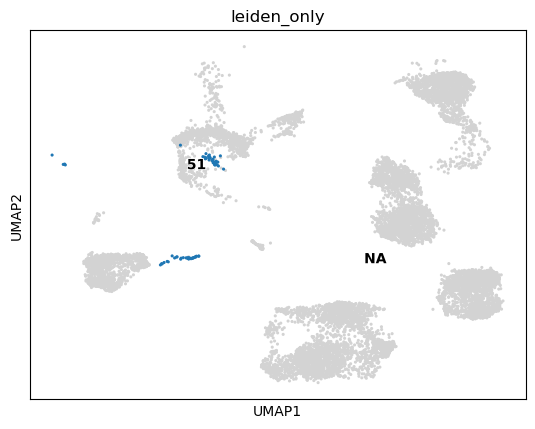

In [144]:
adata_result.obs['leiden_only'] = adata_result.obs['leiden'].astype(str)
adata_result.obs.loc[adata_result.obs['leiden'] != '51', 'leiden_only'] = None
sc.pl.umap(
    adata_result,
    color='leiden_only',
    legend_loc='on data',
    size=20,
    legend_fontsize=10,
    legend_fontoutline=1
)


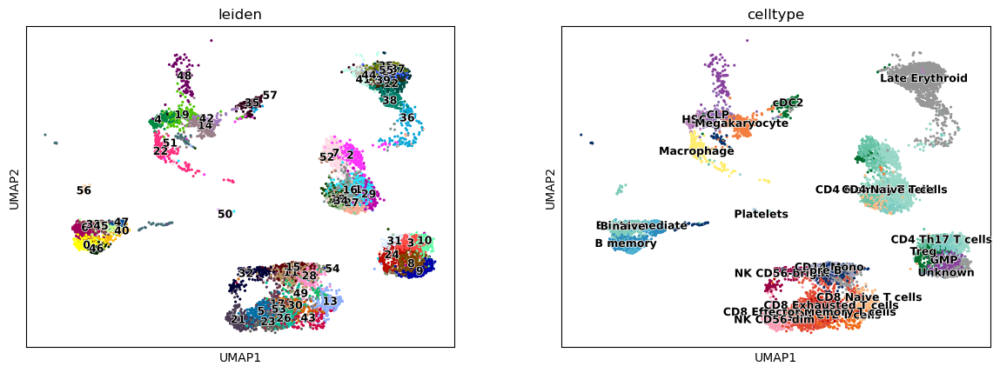

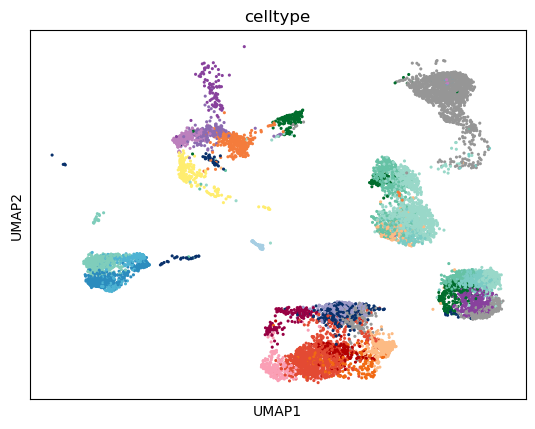

In [143]:
adata_result.uns['celltype_colors'] = [
    celltype_colors_dict.get(c, "#CCCCCC")  # 若未定义则灰色
    for c in adata_result.obs['celltype'].cat.categories
]

sc.pl.umap(
    adata_result,
    color=['leiden', 'celltype'],
    legend_loc='on data',
    size=20,                    # 点的大小
    legend_fontsize=9,         # 图例字体大小
    # save="_leiden_celltype.pdf",   # 文件名，自动保存在 ./figures/umap_leiden_celltype.pdf
    legend_fontoutline=1
)

# 2) celltype：不显示任何文字图例
sc.pl.umap(
    adata_result,
    color='celltype',
    legend_loc=None,
    size=20
)

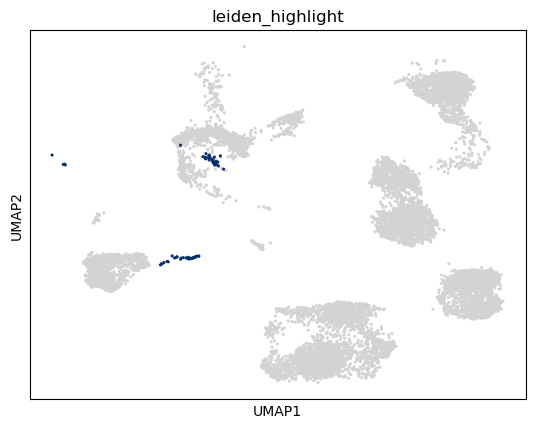

In [145]:
# 1. 确保是字符串
adata_result.obs['leiden_only'] = adata_result.obs['leiden'].astype(str)

# 2. 要高亮的簇
highlight_clusters = ['51'] # "Erythroid progenitor"

# 3. 合并成一个统一标签
adata_result.obs['leiden_highlight'] = None
adata_result.obs.loc[
    adata_result.obs['leiden_only'].isin(highlight_clusters),
    'leiden_highlight'
] = 'Highlighted clusters'

# 4. 画 UMAP（统一颜色）
sc.pl.umap(
    adata_result,
    color='leiden_highlight',
    # palette={'Highlighted clusters': '#fed98e'},  # "Erythroid progenitor"
    # palette={'Highlighted clusters': '#f47c3c'},  # Megakaryocyte"
    # palette={'Highlighted clusters': "#b2df8a"},  # "pDC"
    # "cDC1": "#31a354",
    # "cDC2": "#006d2c",
    palette={"Highlighted clusters": "#08306b",},  # "PreB"
    # palette={"Highlighted clusters": "#bc80bd",},  # "HSC"
    # palette={"Highlighted clusters": "#8c6bb1",},  # "CLP"
    # palette={"Highlighted clusters": "#ffed6f",},  # "Macrophage"
    # palette={"Highlighted clusters": "#110303",},  # "Late Erythroid"
    # "GMP": "#88419d",
    # "Erythroid": "#0b0a0a",
    # "Late Erythroid": "#110303",
    # palette={'Highlighted clusters': "#ffed6f"},  # "Macrophage"
    na_color='lightgrey',
    size=20,
    legend_loc=None,
    legend_fontsize=10,
    legend_fontoutline=1
)


In [111]:
# topN_summary.to_csv(f'topN_summary_{treatrment}_{response}.csv')
def get_cluster_proportions(adata, cluster_key='leiden'):
    s = adata.obs[cluster_key].astype('category').cat.remove_unused_categories()
    counts = s.value_counts()
    props  = (counts / counts.sum())
    out = pd.DataFrame({
        'n_cells': counts.sort_index(),
        'prop': props.sort_index(),
        'percent': (props.sort_index() * 100).round(2)
    })
    # 若类别名是数字字符串，按数值排序更直观
    try:
        out = out.sort_index(key=lambda idx: idx.astype(int))
    except Exception:
        pass
    return out

leiden_prop = get_cluster_proportions(adata_result, 'leiden')
leiden_prop.to_csv(f'leiden_prop_{treatrment}_{response}.csv')

topN_summary_sub = pd.DataFrame({
    k: {
        "lineage": v["lineage"][0],
        "lineage_score": v["lineage"][1],
        **{
            f"subtype_{i+1}": v["top_subtypes"][i][0] if len(v["top_subtypes"]) > i else None
            for i in range(3)
        },
        **{
            f"subtype_score_{i+1}": v["top_subtypes"][i][1] if len(v["top_subtypes"]) > i else None
            for i in range(3)
        }
    }
    for k, v in cluster_topN.items()
}).T
topN_summary_sub.to_csv(f'topN_summary_sub_{treatrment}_{response}.csv')
cross_tab = pd.crosstab(
    adata_result.obs['leiden'],
    adata_result.obs['celltype'],
    normalize='index'
).round(3)

cross_tab.to_csv(f'leiden_celltype_crosstab_{treatrment}_{response}.csv')


In [22]:
import scanpy as sc
import pandas as pd
from itertools import combinations

group_files = {
    # ===== HC =====
    # "HC_EMP":            "adata_HC_EMP.h5ad",
    # "HC_HSC":            "adata_HC_HSC.h5ad",
    # "HC_NK":             "adata_HC_NK.h5ad",
    # "HC_GMP1":            "adata_HC_GMP1.h5ad",
    # "HC_cDC1":           "adata_HC_cDC1.h5ad",
    # "HC_macrophage3":    "adata_HC_macrophage3.h5ad",
    # "HC_Erythroid(right)":"adata_HC_Erythroid.h5ad",

    # ===== pre_res =====
    "pre_res_MPPCLP1":   "RR_pre_res_MPPCLP1.h5ad",
    "pre_res_HSCLSC":    "RR_pre_res_HSCLSC.h5ad",
    "pre_res_EMP":       "RR_pre_res_EMP.h5ad",
    # "pre_res_MPPCLP2":   "adata_pre_res_MPPCLP2.h5ad",
    # "pre_res_LE":        "adata_pre_res_LE.h5ad",
    # "pre_res_GMP1":      "adata_pre_res_GMP1.h5ad",
    # "pre_res_GMP2":      "adata_pre_res_GMP2.h5ad",
    # "pre_res_macrophage2":"adata_pre_res_macrophage2.h5ad",
    # "pre_res_Erythroid(right)":"adata_pre_res_Erythroid.h5ad",

    # ===== pre_nres =====
    "pre_nres_HSCLSC":   "RR_pre_nres_HSCLSC.h5ad",
    "pre_nres_MPPCLP1":  "RR_pre_nres_MPPCLP1.h5ad",
    "pre_nres_EMP":      "RR_pre_nres_EMP.h5ad",
    # "pre_nres_LE":       "adata_pre_nres_LE.h5ad",
    # "pre_nres_Erythroid(right)":"adata_pre_nres_Erythroid.h5ad",

    # ===== post_res =====
    # "post_res_EMP":      "adata_post_res_EMP.h5ad",
    # "post_res_LE":       "adata_post_res_LE.h5ad",
    # "post_res_GMP1":     "adata_post_res_GMP1.h5ad",
    # "post_res_Erythroid(right)":"adata_post_res_Erythroid.h5ad",

    # ===== post_nres =====
    # "post_nres_ASDC":        "adata_post_nres_ASDC.h5ad",
    # "post_nres_MPPpreB":     "adata_post_nres_MPPpreB.h5ad",
    "post_nres_HSCLSC":      "RR_post_nres_HSCLSC.h5ad",
    "post_nres_MPPCLP1":      "RR_post_nres_MPPCLP1.h5ad",
    "post_nres_EMP":         "RR_post_nres_EMP.h5ad",
    # "post_nres_Macrophage1": "adata_post_nres_Macrophage1.h5ad",
    # "post_nres_LE":          "adata_post_nres_LE.h5ad",
    # "post_nres_GMP1":        "adata_post_nres_GMP1.h5ad",
    # "post_nres_Erythroid(right)":"adata_post_nres_Erythroid.h5ad",
}

# 读入
adatas = {g: sc.read_h5ad(f) for g, f in group_files.items()}


In [40]:
for i in ['pre_res_MPPCLP1', 'pre_res_HSCLSC', 'pre_res_EMP', 'pre_nres_HSCLSC', 'pre_nres_MPPCLP1', 'pre_nres_EMP', 'post_nres_HSCLSC', 'post_nres_MPPCLP1', 'post_nres_EMP']:
    print(i)
    print(adatas[i].n_obs)


pre_res_MPPCLP1
477
pre_res_HSCLSC
205
pre_res_EMP
259
pre_nres_HSCLSC
340
pre_nres_MPPCLP1
217
pre_nres_EMP
379
post_nres_HSCLSC
205
post_nres_MPPCLP1
95
post_nres_EMP
215


In [39]:
# 读入
adatas[i].n_obs


215

In [75]:
df_wide.to_csv('Upregulated in Pre-responder compared to pre-nonresponder.csv')

In [31]:
import pandas as pd

# ===== 1. 读入数据 =====
df = pd.read_csv("./Upregulated in Post-nonresponder compared to pre-nonresponder0.csv")

# 如果列名和你实际的不完全一致，可以在这里统一
df = df.rename(columns={
    "Gene": "gene",          # 如果原来是 Gene
    "celltype": "pair",      # 如果原来不是 pair
})

# ===== 2. 只保留你关心的 pair（可选，但推荐）=====
pairs_keep = ["EMP", "MPPCLP1", "HSCLSC"]
df = df[df["pair"].isin(pairs_keep)]

# ===== 3. 设置多级索引：gene × pair =====
df_idx = df.set_index(["gene", "pair"])

# ===== 4. 选择要展开的指标列 =====
# value_cols = [
#     "p_value",
#     "mean_pre_pos",
#     "mean_post_pos",
#     "FC_post_over_pre"
# ]
value_cols = [
    "p_value",
    "mean_g1_pos",
    "mean_g2_pos",
    "FC_g2_over_g1"
]
# ===== 5. unstack pair → 自动补 NaN =====
df_wide = (
    df_idx[value_cols]
    .unstack("pair")        # columns 变成 (metric, pair)
)

# ===== 6. 调整列顺序：pair 在前，metric 在后 =====
df_wide = df_wide.swaplevel(0, 1, axis=1)
df_wide = df_wide.sort_index(axis=1, level=0)

# ===== 7. 压平成单层列名（推荐）=====
df_wide.columns = [
    f"{pair}__{metric}"
    for pair, metric in df_wide.columns
]
df_wide.to_csv('Upregulated in Post-nonresponder compared to pre-nonresponder.csv')

In [35]:
import os
import pandas as pd
import glob

# ===== 1) 参数 =====
INPUT_DIR = "./gene_go_networks/Upregulated in Pre-responder compared to pre-nonresponder"   # 放 GO_id_map_*.csv 的文件夹，"." 表示当前目录
PATTERN = "GO_id_map_*_*.csv"
OUT_FILE = "GO_id_map_merged_with_filenames.csv"

# ===== 2) 找到所有文件 =====
files = sorted(glob.glob(os.path.join(INPUT_DIR, PATTERN)))

if len(files) == 0:
    raise FileNotFoundError("没有找到匹配的 GO_id_map_*.csv 文件")

# ===== 3) 写入合并文件 =====
with open(OUT_FILE, "w", encoding="utf-8") as fout:
    for i, f in enumerate(files):
        fname = os.path.basename(f)

        # 文件名作为“分隔行”
        fout.write(f"# FILE: {fname}\n")

        # 读取 csv
        df = pd.read_csv(f)

        # 写内容（第一个文件保留 header，其余文件也保留，方便人读）
        df.to_csv(fout, index=False)

        # 文件之间空一行
        fout.write("\n")

print(f"✅ 合并完成，输出文件：{OUT_FILE}")


✅ 合并完成，输出文件：GO_id_map_merged_with_filenames.csv


In [267]:
genes = [
    "CDK6", "NRIP1", "MBD2", "JUND", "PRKN",
    "CALN1", "NKAIN2", "EEF1A1", "MACROD2",
    "NPDC1", "NPR3", "FLT3", "ERG"
]
genes = ['BCL2L1',"CALN1"
]

# gene = 'BCL2L1'

print(gene in adata.var_names)

import re

pattern = r"^CD.$"

akt_genes = adata.var_names[adata.var_names.str.match(pattern)]
akt_genes.tolist()

True


['CDA', 'CD2', 'CD6', 'CD5', 'CD9', 'CD4', 'CD7']

In [262]:
mean_expr_dict = {}

for group_name, ad in adatas.items():
    # 保证基因都在 var_names 里
    genes_in_adata = [g for g in genes if g in ad.var_names]
    if len(genes_in_adata) == 0:
        continue

    # subset to genes
    ad_sub = ad[:, genes_in_adata]
    df = ad_sub.to_df()      # cells × genes

    # 每个基因在该组（所有细胞）的平均表达
    mean_expr = df.mean(axis=0)  # index=gene
    mean_expr_dict[group_name] = mean_expr

# 组合成一个大表：行=组，列=基因
mean_expr_df = pd.DataFrame(mean_expr_dict).T  # groups × genes
# 为了列顺序统一
mean_expr_df = mean_expr_df.reindex(columns=genes)

print(mean_expr_df.head())


           BCL2L1     CALN1
HC_EMP   0.134513  0.064036
HC_HSC   0.123354  0.142495
HC_NK    0.117613  0.000000
HC_GMP1  0.047345  0.010342
HC_cDC1  0.062549  0.003417


In [264]:
mean_expr_df.to_csv('Konopleva_BCL2L1expression.csv')

In [237]:
def get_condition(name: str) -> str:
    parts = name.split("_")
    if parts[0] == "HC":
        return "HC"
    # pre_res_EMP / post_nres_GMP 这类
    return "_".join(parts[:2])

def get_celltype(name: str) -> str:
    parts = name.split("_")
    if parts[0] == "HC":
        ct = "_".join(parts[1:])     # EMP / macrophage
    else:
        ct = "_".join(parts[2:])     # EMP / GMP / preB / ASDC
    return ct.lower()                

cond2groups = {}
ct2groups = {}

for g in adatas.keys():
    cond = get_condition(g)
    ct = get_celltype(g)

    cond2groups.setdefault(cond, []).append(g)
    ct2groups.setdefault(ct, []).append(g)

print("cond2groups:", cond2groups.keys())
print("ct2groups:", ct2groups.keys())


cond2groups: dict_keys(['HC', 'pre_res', 'pre_nres', 'post_res', 'post_nres'])
ct2groups: dict_keys(['emp', 'hsc', 'nk', 'gmp1', 'cdc1', 'macrophage3', 'erythroid(right)', 'mppclp1', 'hsclsc', 'mppclp2', 'le', 'gmp2', 'macrophage2', 'asdc', 'mpppreb', 'macrophage1'])


In [238]:
ct2groups={
    "emp": [
        "HC_EMP",
        "pre_res_EMP",
        "pre_nres_EMP",
        "post_res_EMP",
        "post_nres_EMP",
    ],

    "gmp1": [
        "HC_cDC1",
        "HC_GMP1",
        "pre_res_GMP1",
        "post_res_GMP1",
        "post_nres_GMP1",
    ],

    "mppclp1": [
        "pre_res_GMP2",
        "pre_res_MPPCLP1",
        "pre_nres_MPPCLP1",
        "post_nres_ASDC",
        "post_nres_MPPpreB",
        "post_nres_MPPCLP1",
    ],

    "hsclsc": [
        "HC_HSC",
        "pre_res_HSCLSC",
        "pre_nres_HSCLSC",
        "post_nres_HSCLSC",
    ],

    "Late Erythroid(left)": [
        "HC_NK",
        "pre_res_MPPCLP2",
        "pre_res_LE",
        "pre_nres_LE",
        "post_res_LE",
        "post_nres_LE",
        "post_nres_Macrophage1",
    ],

    "macrophage": [
        "HC_macrophage3",
        "pre_res_macrophage2",
        "post_nres_Macrophage1",
    ],
}


In [239]:
cond2groups

{'HC': ['HC_EMP',
  'HC_HSC',
  'HC_NK',
  'HC_GMP1',
  'HC_cDC1',
  'HC_macrophage3',
  'HC_Erythroid(right)'],
 'pre_res': ['pre_res_MPPCLP1',
  'pre_res_HSCLSC',
  'pre_res_EMP',
  'pre_res_MPPCLP2',
  'pre_res_LE',
  'pre_res_GMP1',
  'pre_res_GMP2',
  'pre_res_macrophage2',
  'pre_res_Erythroid(right)'],
 'pre_nres': ['pre_nres_HSCLSC',
  'pre_nres_MPPCLP1',
  'pre_nres_EMP',
  'pre_nres_LE',
  'pre_nres_Erythroid(right)'],
 'post_res': ['post_res_EMP',
  'post_res_LE',
  'post_res_GMP1',
  'post_res_Erythroid(right)'],
 'post_nres': ['post_nres_ASDC',
  'post_nres_MPPpreB',
  'post_nres_HSCLSC',
  'post_nres_MPPCLP1',
  'post_nres_EMP',
  'post_nres_Macrophage1',
  'post_nres_LE',
  'post_nres_GMP1',
  'post_nres_Erythroid(right)']}

In [249]:


# =========================
# Utils
# =========================

def pct_expressed(ad, groupby, group, threshold=0):
    obs_vals = ad.obs[groupby].astype(str).values
    group = str(group)
    idx = (obs_vals == group)
    n = int(idx.sum())
    if n == 0:
        return np.zeros(ad.n_vars, dtype=float)

    X = ad.X[idx]
    if sp.issparse(X):
        return np.asarray((X > threshold).mean(axis=0)).ravel()
    else:
        return (X > threshold).mean(axis=0)

def safe_concat_many(ad_list, labels, key):
    safe = [f"s{i}" for i in range(len(ad_list))]
    ad_all = ad_list[0].concatenate(
        *ad_list[1:],
        batch_key=key,
        batch_categories=safe,
        index_unique=None
    )
    mapper = dict(zip(safe, labels))
    ad_all.obs[key] = ad_all.obs[key].astype(str).map(mapper).astype("category")
    return ad_all

def safe_concat_two(ad1, ad2, label1, label2, key, genes_use=None):
    if genes_use is not None:
        ad1 = ad1[:, genes_use]
        ad2 = ad2[:, genes_use]
    ad = ad1.concatenate(
        ad2,
        batch_key=key,
        batch_categories=["s0", "s1"],
        index_unique=None
    )
    ad.obs[key] = ad.obs[key].astype(str).map({"s0": label1, "s1": label2}).astype("category")
    return ad

# =========================
# (A) Axis1: within condition, across cell types
# =========================

# ---- 1) 预计算：每个 condition 一套 HVG（只算一次）----
cond_hvgs = {}
for cond, groups in cond2groups.items():
    if len(groups) < 2:
        continue

    ad_list = [adatas[g] for g in groups]
    ad_all = safe_concat_many(ad_list, labels=groups, key="cell_type")

    sc.pp.filter_genes(ad_all, min_cells=max(3, int(0.01 * ad_all.n_obs)))

    sc.pp.highly_variable_genes(
        ad_all,
        n_top_genes=2000,
        flavor="cell_ranger",
        n_bins=10
    )
    cond_hvgs[cond] = ad_all.var_names[ad_all.var["highly_variable"]].tolist()

print("Prepared HVGs for conditions:", {k: len(v) for k, v in cond_hvgs.items()})


# ---- 2) Axis1 pairwise DE：同一 condition 内两两 cell type 比较（只用该 condition HVG）----
axis1_results = []
c1 = 0
skipped1 = []

MIN_CELLS_PER_GROUP = 10
MIN_GENES_USE = 200

for cond, groups in cond2groups.items():
    if len(groups) < 2:
        continue

    hvg = cond_hvgs.get(cond, None)
    if not hvg:
        continue

    for g1, g2 in combinations(groups, 2):
        ad1 = adatas[g1]
        ad2 = adatas[g2]

        genes_use = [x for x in hvg if (x in ad1.var_names and x in ad2.var_names)]
        if len(genes_use) < MIN_GENES_USE:
            skipped1.append((cond, g1, g2, "too_few_genes_use", len(genes_use)))
            continue

        ad = safe_concat_two(ad1, ad2, label1=g1, label2=g2, key="cell_type", genes_use=genes_use)

        # ---- sanity check 1：两组细胞数是否足够 ----
        vc = ad.obs["cell_type"].astype(str).value_counts().to_dict()
        n1 = int(vc.get(g1, 0))
        n2 = int(vc.get(g2, 0))
        if n1 < MIN_CELLS_PER_GROUP or n2 < MIN_CELLS_PER_GROUP:
            skipped1.append((cond, g1, g2, "too_few_cells", (n1, n2)))
            continue

        # ---- sanity check 2：去掉两组都全 0 的基因（避免 stats=None）----
        pts_1_tmp = pct_expressed(ad, "cell_type", g1)
        pts_2_tmp = pct_expressed(ad, "cell_type", g2)
        keep = (pts_1_tmp > 0) | (pts_2_tmp > 0)
        if int(keep.sum()) < MIN_GENES_USE:
            skipped1.append((cond, g1, g2, "all_zero_or_constant_genes", int(keep.sum())))
            continue

        ad2s = ad[:, keep].copy()

        # ---- DE：try/except 保底 ----
        try:
            sc.tl.rank_genes_groups(
                ad2s,
                groupby="cell_type",
                groups=[g1],
                reference=g2,
                method="wilcoxon",
                n_genes=min(ad2s.n_vars, 3000),
            )
        except Exception as e:
            skipped1.append((cond, g1, g2, "rank_genes_groups_failed", repr(e)))
            continue

        # pts / pts_rest（基于 ad2s）
        pts_g1 = pct_expressed(ad2s, "cell_type", g1)
        pts_g2 = pct_expressed(ad2s, "cell_type", g2)

        df = sc.get.rank_genes_groups_df(ad2s, group=g1).copy()
        df["axis"] = "within_condition_celltype"
        df["condition"] = cond
        df["celltype_1"] = g1
        df["celltype_2"] = g2
        df["n_hvg_used"] = int(ad2s.n_vars)
        df["n_cells_c1"] = n1
        df["n_cells_c2"] = n2

        idx_gene = ad2s.var_names.get_indexer(df["names"])
        ok = idx_gene >= 0
        df = df.loc[ok].copy()
        idx_gene = idx_gene[ok]

        df["pts"] = pts_g1[idx_gene]
        df["pts_rest"] = pts_g2[idx_gene]

        axis1_results.append(df)
        c1 += 1

axis1_deg = pd.concat(axis1_results, ignore_index=True) if len(axis1_results) else pd.DataFrame()
print("Axis1 comparisons:", c1, "Axis1 DEG rows:", axis1_deg.shape)

# 可选：查看 Axis1 跳过原因
skipped1_df = pd.DataFrame(skipped1, columns=["condition", "g1", "g2", "reason", "detail"])
print(skipped1_df["reason"].value_counts())
# skipped1_df.to_csv("axis1_skipped_pairs.csv", index=False)


C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:21: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad_all = ad_list[0].concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:21: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad_all = ad_list[0].concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:21: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad_all = ad_list[0].concatenate(
C:\Users\abdul\A

Prepared HVGs for conditions: {'HC': 2000, 'pre_res': 2000, 'pre_nres': 2000, 'post_res': 2000, 'post_nres': 2000}


C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\

Axis1 comparisons: 109 Axis1 DEG rows: (211924, 14)
Series([], Name: count, dtype: int64)


C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(


In [251]:
print(c1) 

P_CUT   = 0.01
LFC_CUT = 0.5
PTS_DELTA = 0.10
PTS_MIN   = 0.10

df = axis1_deg.replace([np.inf, -np.inf], np.nan).dropna(subset=["pvals_adj","logfoldchanges","names"]).copy()

# rank_genes_groups_df 通常含 pts/pts_rest（若没有就看第2条的做法）
need_cols = ["pts", "pts_rest"]
missing = [c for c in need_cols if c not in df.columns]
if missing:
    print("Missing columns:", missing, "→ 看下面第2条：在 rank_genes_groups 时启用 pts 计算/或自己算。")

axis1_deg_filt = df.query(
    "pvals_adj < @P_CUT and abs(logfoldchanges) > @LFC_CUT"
).copy()

# pct filters（如果 pts/pts_rest 存在）
if "pts" in axis1_deg_filt.columns and "pts_rest" in axis1_deg_filt.columns:
    axis1_deg_filt = axis1_deg_filt[
        ((axis1_deg_filt["pts"] - axis1_deg_filt["pts_rest"]).abs() >= PTS_DELTA) &
        (axis1_deg_filt[["pts","pts_rest"]].max(axis=1) >= PTS_MIN)
    ].copy()



print(axis1_deg_filt.shape)
axis1_deg_filt.to_csv('same_condition_deg_filt.csv')
# axis1_deg_filt.head()
axis1_deg_filt

109
(34218, 14)


,names,scores,logfoldchanges,pvals,pvals_adj,axis,condition,celltype_1,celltype_2,n_hvg_used,n_cells_c1,n_cells_c2,pts,pts_rest
0,FCER1A,5.254657,2.561960,1.483004e-07,4.646747e-06,within_condition_celltype,HC,HC_EMP,HC_HSC,1974,164,242,0.408537,0.119835
1,PLEK,4.787931,1.979276,1.685096e-06,4.376816e-05,within_condition_celltype,HC,HC_EMP,HC_HSC,1974,164,242,0.451220,0.219008
2,CNRIP1,4.595724,4.188721,4.312489e-06,1.038153e-04,within_condition_celltype,HC,HC_EMP,HC_HSC,1974,164,242,0.286585,0.016529
3,CD7,4.384555,2.734056,1.162230e-05,2.637059e-04,within_condition_celltype,HC,HC_EMP,HC_HSC,1974,164,242,0.323171,0.074380
4,CPA3,4.271645,2.859554,1.940367e-05,4.209103e-04,within_condition_celltype,HC,HC_EMP,HC_HSC,1974,164,242,0.317073,0.082645
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211919,SLC4A1,-10.224265,-33.386097,1.543946e-24,3.859864e-22,within_condition_celltype,post_nres,post_nres_GMP1,post_nres_Erythroid(right),2000,55,1505,0.000000,0.810631
211920,SLC25A37,-10.895776,-7.581127,1.207338e-27,4.024461e-25,within_condition_celltype,post_nres,post_nres_GMP1,post_nres_Erythroid(right),2000,55,1505,0.090909,0.878405
211921,HBA1,-11.014017,-9.648964,3.270867e-28,1.308347e-25,within_condition_celltype,post_nres,post_nres_GMP1,post_nres_Erythroid(right),2000,55,1505,0.072727,0.884385
211922,HBA2,-11.062015,-10.370000,1.917412e-28,9.587059e-26,within_condition_celltype,post_nres,post_nres_GMP1,post_nres_Erythroid(right),2000,55,1505,0.072727,0.886379


In [252]:
axis2_results = []
c2 = 0
skipped = []

MIN_CELLS_PER_GROUP = 10   # 你可以改成 5/20
MIN_GENES_USE = 200        # 你原来是 200

for ct, groups in ct2groups.items():
    if len(groups) < 2:
        continue

    hvg = ct_hvgs.get(ct, None)
    if not hvg:
        continue

    for g1, g2 in combinations(groups, 2):
        ad1 = adatas[g1]
        ad2 = adatas[g2]

        cond1 = g1.rsplit("_", 1)[0]
        cond2 = g2.rsplit("_", 1)[0]

        # 取交集
        genes_use = [x for x in hvg if (x in ad1.var_names and x in ad2.var_names)]
        if len(genes_use) < MIN_GENES_USE:
            skipped.append((ct, g1, g2, "too_few_genes_use", len(genes_use)))
            continue

        # 安全 concat
        ad = safe_concat_two(ad1, ad2, label1=cond1, label2=cond2, key="condition", genes_use=genes_use)

        # ---- 关键 sanity check 1：两组细胞数是否足够 ----
        vc = ad.obs["condition"].astype(str).value_counts().to_dict()
        n1 = int(vc.get(cond1, 0))
        n2 = int(vc.get(cond2, 0))
        if n1 < MIN_CELLS_PER_GROUP or n2 < MIN_CELLS_PER_GROUP:
            skipped.append((ct, g1, g2, "too_few_cells", (n1, n2)))
            continue

        # ---- 关键 sanity check 2：去掉在两组都全 0 的基因（否则统计可能为空）----
        # 这里用 pct_expressed 快速判断两组都不表达的基因
        pts_c1_tmp = pct_expressed(ad, "condition", cond1)
        pts_c2_tmp = pct_expressed(ad, "condition", cond2)
        keep = (pts_c1_tmp > 0) | (pts_c2_tmp > 0)
        if int(keep.sum()) < MIN_GENES_USE:
            skipped.append((ct, g1, g2, "all_zero_or_constant_genes", int(keep.sum())))
            continue

        # subset 到保留基因再跑 DE（避免 scanpy 内部 stats=None）
        ad2s = ad[:, keep].copy()

        # ---- 关键 sanity check 3：每组至少有一些表达变化（可选，但很有效）----
        # 如果你发现仍然会炸，可以开启下面这一段：检查是否存在非零基因方差
        # if sp.issparse(ad2s.X):
        #     # 粗略：检查每个基因是否至少在任一组出现过非零（已经保证），通常够了
        #     pass

        # 跑 DE（用 try/except 保底）
        try:
            sc.tl.rank_genes_groups(
                ad2s,
                groupby="condition",
                groups=[cond1],
                reference=cond2,
                method="wilcoxon",
                n_genes=min(ad2s.n_vars, 3000),   # 避免 n_genes > n_vars
            )
        except Exception as e:
            skipped.append((ct, g1, g2, "rank_genes_groups_failed", repr(e)))
            continue

        # 重新计算 pts（基于 ad2s 的基因集合）
        pts_c1 = pct_expressed(ad2s, "condition", cond1)
        pts_c2 = pct_expressed(ad2s, "condition", cond2)

        df = sc.get.rank_genes_groups_df(ad2s, group=cond1).copy()
        df["axis"] = "within_celltype_condition"
        df["cell_type"] = ct
        df["condition_1"] = cond1
        df["condition_2"] = cond2
        df["n_hvg_used"] = int(ad2s.n_vars)
        df["n_cells_c1"] = n1
        df["n_cells_c2"] = n2

        idx_gene = ad2s.var_names.get_indexer(df["names"])
        ok = idx_gene >= 0
        df = df.loc[ok].copy()
        idx_gene = idx_gene[ok]

        df["pts"] = pts_c1[idx_gene]
        df["pts_rest"] = pts_c2[idx_gene]

        axis2_results.append(df)
        c2 += 1

axis2_deg = pd.concat(axis2_results, ignore_index=True) if len(axis2_results) else pd.DataFrame()
print("Axis2 comparisons:", c2, "Axis2 DEG rows:", axis2_deg.shape)

# 可选：查看跳过了哪些 pair（强烈建议先看一眼）
skipped_df = pd.DataFrame(skipped, columns=["cell_type_group", "g1", "g2", "reason", "detail"])
print(skipped_df["reason"].value_counts())
# skipped_df.to_csv("axis2_skipped_pairs.csv", index=False)


C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(
C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\

Axis2 comparisons: 58 Axis2 DEG rows: (112799, 14)
reason
rank_genes_groups_failed    7
Name: count, dtype: int64


C:\Users\abdul\AppData\Local\Temp\ipykernel_8208\396526438.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ad = ad1.concatenate(


In [ ]:
print(c2)
P_CUT = 0.01
LFC_CUT = 0.5   # 单细胞常用 0.25（也有人用 0.5）

axis2_deg_filt = (
    axis2_deg
    .replace([np.inf, -np.inf], np.nan)
    .dropna(subset=["pvals_adj", "logfoldchanges", "names"])
    .query("pvals_adj < @P_CUT and abs(logfoldchanges) > @LFC_CUT")
    .copy()
)

print(axis2_deg_filt.shape)
axis2_deg_filt.to_csv('same_location_deg_filt.csv')
axis2_deg_filt

58
(14200, 14)


,names,scores,logfoldchanges,pvals,pvals_adj,axis,cell_type,condition_1,condition_2,n_hvg_used,n_cells_c1,n_cells_c2,pts,pts_rest
0,GAPDH,16.187082,4.210207,6.220876e-59,1.234844e-55,within_celltype_condition,emp,HC,pre_res,1985,164,433,0.939024,0.408776
1,FAU,14.464476,3.249370,2.031466e-47,1.344153e-44,within_celltype_condition,emp,HC,pre_res,1985,164,433,0.896341,0.487298
2,FOSB,14.391117,3.139970,5.883801e-47,2.919836e-44,within_celltype_condition,emp,HC,pre_res,1985,164,433,0.963415,0.563510
3,PPIA,14.369322,3.306820,8.061680e-47,3.200487e-44,within_celltype_condition,emp,HC,pre_res,1985,164,433,0.884146,0.418014
4,TSC22D3,14.168914,3.511287,1.426909e-45,4.046306e-43,within_celltype_condition,emp,HC,pre_res,1985,164,433,0.908537,0.431871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112794,CA1,-4.633931,-8.997187,3.587860e-06,1.367703e-04,within_celltype_condition,macrophage,pre_res,post_nres,1977,189,52,0.005291,0.423077
112795,SLC4A1,-4.669871,-31.374399,3.013894e-06,1.216014e-04,within_celltype_condition,macrophage,pre_res,post_nres,1977,189,52,0.000000,0.423077
112796,HBB,-5.000063,-6.042389,5.731141e-07,3.062288e-05,within_celltype_condition,macrophage,pre_res,post_nres,1977,189,52,0.185185,0.538462
112797,NFIA,-5.239285,-7.646849,1.612000e-07,9.959136e-06,within_celltype_condition,macrophage,pre_res,post_nres,1977,189,52,0.010582,0.480769


In [ ]:



axis1_results = []

for cond, groups in cond2groups.items():  # cond = pre_res / pre_nres / post_res ...
    if len(groups) < 2:
        continue

    for g1, g2 in combinations(groups, 2):
        ad1 = adatas[g1]
        ad2 = adatas[g2]

        ad = ad1.concatenate(
            ad2,
            batch_key="cell_type",
            batch_categories=[g1, g2],
            index_unique=None
        )

        sc.tl.rank_genes_groups(
            ad,
            groupby="cell_type",
            groups=[g1],
            reference=g2,
            method="wilcoxon"
        )

        df = sc.get.rank_genes_groups_df(ad, group=g1)
        df["axis"] = "within_condition_celltype"
        df["condition"] = cond
        df["celltype_1"] = g1
        df["celltype_2"] = g2

        axis1_results.append(df)

axis1_deg = pd.concat(axis1_results, ignore_index=True)


In [110]:
pattern_expr =mean_expr_df.copy()
for col in range(mean_expr_df.shape[1]):
    average = np.mean(mean_expr_df.iloc[:,col])
    for row in range(mean_expr_df.shape[0]):
        # if mean_expr_df.iloc[row,col]>average:
        #     pattern_expr.iloc[row,col] =  '>'
        # elif mean_expr_df.iloc[row,col]<average:
        #     pattern_expr.iloc[row,col] =  '<'
        pattern_expr.iloc[row,col] =  mean_expr_df.iloc[row,col] /average
pattern_expr.to_csv('pattern_expr.csv')



In [71]:
rows = []
groups = mean_expr_df.index.tolist()

for gene in genes:
    for g1, g2 in combinations(groups, 2):
        v1 = mean_expr_df.loc[g1, gene]
        v2 = mean_expr_df.loc[g2, gene]

        rows.append({
            "gene": gene,
            "group1": g1,
            "group2": g2,
            "mean_expr_group1": v1,
            "mean_expr_group2": v2,
            "mean_diff": v1 - v2,
            "abs_mean_diff": abs(v1 - v2),  # 这个越小越“相似”
        })

pairwise_gene_df = pd.DataFrame(rows)
print(pairwise_gene_df.head())


   gene group1     group2  mean_expr_group1  mean_expr_group2  mean_diff  \
0  CDK6   HC_C       HC_A          1.242525          0.063787   1.178737   
1  CDK6   HC_C       HC_B          1.242525          1.062995   0.179530   
2  CDK6   HC_C       HC_E          1.242525          0.349910   0.892615   
3  CDK6   HC_C       HC_F          1.242525          0.338023   0.904502   
4  CDK6   HC_C  pre_res_A          1.242525          2.292438  -1.049913   

   abs_mean_diff  
0       1.178737  
1       0.179530  
2       0.892615  
3       0.904502  
4       1.049913  


In [38]:
import numpy as np
from scipy.stats import mannwhitneyu
import scipy.sparse as sp
import pandas as pd

def get_gene_values(ad, gene):
    # 基因不存在就返回 None
    if gene not in ad.var_names:
        return None

    # 找到该基因的列索引
    idx = np.where(ad.var_names == gene)[0][0]

    # 提取这一列表达
    if sp.issparse(ad.X):
        vals = ad.X[:, idx].toarray().ravel()  # (n_cells, 1) -> (n_cells,)
    else:
        vals = np.asarray(ad.X[:, idx]).ravel()

    # 转 float，去 NaN
    vals = vals.astype(float)
    vals = vals[~np.isnan(vals)]

    # 也可以顺手去掉 inf（保险起见）
    vals = vals[np.isfinite(vals)]

    if vals.size == 0:
        return None
    return vals


rows = []
group_names = list(adatas.keys())

for gene in genes:
    for g1, g2 in combinations(group_names, 2):
        x = get_gene_values(adatas[g1], gene)
        y = get_gene_values(adatas[g2], gene)

        # 有一边没有数据就跳过
        if x is None or y is None:
            continue

        # Mann-Whitney U test
        stat, p = mannwhitneyu(x, y, alternative="two-sided")

        rows.append({
            "gene": gene,
            "group1": g1,
            "group2": g2,
            "n1": len(x),
            "n2": len(y),
            "p_value": p
        })

stats_df = pd.DataFrame(rows)
print(stats_df.head())


   gene group1 group2   n1    n2       p_value
0  CDK6   HC_C   HC_A  141    23  2.272264e-08
1  CDK6   HC_C   HC_B  141   242  6.902405e-03
2  CDK6   HC_C   HC_E  141    78  8.261088e-12
3  CDK6   HC_C   HC_F  141   629  1.720749e-34
4  CDK6   HC_C  pre_A  141  1059  2.290140e-34


In [39]:
stats_df

,gene,group1,group2,n1,n2,p_value
0,CDK6,HC_C,HC_A,141,23,2.272264e-08
1,CDK6,HC_C,HC_B,141,242,6.902405e-03
2,CDK6,HC_C,HC_E,141,78,8.261088e-12
3,CDK6,HC_C,HC_F,141,629,1.720749e-34
4,CDK6,HC_C,pre_A,141,1059,2.290140e-34
...,...,...,...,...,...,...
2465,ERG,nres_C,nres_E,215,73,1.799917e-19
2466,ERG,nres_C,nres_F,215,55,9.070788e-14
2467,ERG,nres_D,nres_E,52,73,2.498758e-03
2468,ERG,nres_D,nres_F,52,55,1.472709e-01


In [40]:
# 合并 mean_diff 和 p值信息
merged_df = pairwise_gene_df.merge(
    stats_df,
    on=["gene", "group1", "group2"],
    how="left"
)


In [42]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def make_matrix(df, gene, value_col, groups):
    """
    df: merged df
    gene: 基因
    value_col: 'abs_mean_diff' or 'p_value'
    groups: 所有 group 的名字
    """
    mat = pd.DataFrame(np.nan, index=groups, columns=groups)

    sub = df[df["gene"] == gene]

    for _, row in sub.iterrows():
        g1, g2 = row["group1"], row["group2"]
        mat.loc[g1, g2] = row[value_col]
        mat.loc[g2, g1] = row[value_col]   # 对称填充

    np.fill_diagonal(mat.values, 0)
    return mat


In [45]:
import os

os.makedirs("gene_heatmaps", exist_ok=True)

groups = mean_expr_df.index.tolist()

for gene in genes:
    # --- 1) mean_diff 热图 (绝对值越小越相似) ---
    mat_diff = make_matrix(merged_df, gene, "abs_mean_diff", groups)

    plt.figure(figsize=(10, 8))
    sns.heatmap(mat_diff, annot=False, cmap="viridis")··························
    plt.savefig(f"gene_heatmaps/{gene}_mean_diff_heatmap.png")
    plt.close()

    # --- 2) p-value 热图 ---
    mat_p = make_matrix(merged_df, gene, "p_value", groups)

    # plt.figure(figsize=(10, 8))
    # sns.heatmap(mat_p, annot=False, cmap="rocket_r", norm=plt.matplotlib.colors.LogNorm())
    # plt.title(f"{gene} - Mann-Whitney P-value")
    # plt.tight_layout()
    # plt.savefig(f"gene_heatmaps/{gene}_pvalue_heatmap.png")
    # plt.close()
    mat_p_capped = mat_p.clip(upper=0.05)

    plt.figure(figsize=(10, 8))
    ax = sns.heatmap(mat_p_capped, cmap="rocket_r", vmin=0, vmax=0.05)

    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0.05, 0.01, 0.001])
    cbar.set_ticklabels(['0.05', '0.01', '0.001'])

    plt.title(f"{gene} - P-value (capped at 0.05)")
    plt.tight_layout()
    plt.savefig(f"gene_heatmaps/{gene}_pvalue_heatmap.png")
    plt.close()

print("完成！所有热图已保存到 gene_heatmaps/ 文件夹。")


完成！所有热图已保存到 gene_heatmaps/ 文件夹。


In [53]:
mean_expression = {}

for name, adata in adatas.items():
    # 转为 dense array（如果是 sparse）
    X = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
    
    mean_vec = np.asarray(X.mean(axis=0))
    
    mean_expression[name] = pd.Series(mean_vec, index=adata.var_names)


In [54]:
df = pd.DataFrame(mean_expression)
df.head()


,HC_A,HC_B,HC_C,pre_A,pre_B,pre_C,pre_D,res_C,nres_A,nres_B,nres_C,nres_D
AL627309.1,0.000000,0.003548,0.007915,0.006013,0.022039,0.024533,0.000000,0.000000,0.005786,0.000000,0.007680,0.000000
AL627309.5,0.024743,0.022180,0.028006,0.008743,0.018496,0.011501,0.010239,0.037405,0.053606,0.016124,0.045197,0.000000
LINC01409,0.013390,0.008667,0.016567,0.086442,0.045912,0.068458,0.051184,0.038920,0.058896,0.037026,0.080604,0.000000
LINC01128,0.028365,0.141670,0.053965,0.043731,0.092764,0.059822,0.065877,0.086661,0.082633,0.115493,0.110427,0.033590
LINC00115,0.045647,0.011533,0.029909,0.009147,0.021503,0.018810,0.000000,0.000000,0.031543,0.010087,0.010149,0.039846


In [56]:
sim_spearman = df.corr(method="spearman")
sim_pearson = df.corr(method="pearson")
from sklearn.metrics.pairwise import cosine_similarity

sim_cosine = pd.DataFrame(
    cosine_similarity(df.T),
    index=df.columns,
    columns=df.columns
)

<Figure size 1000x800 with 0 Axes>

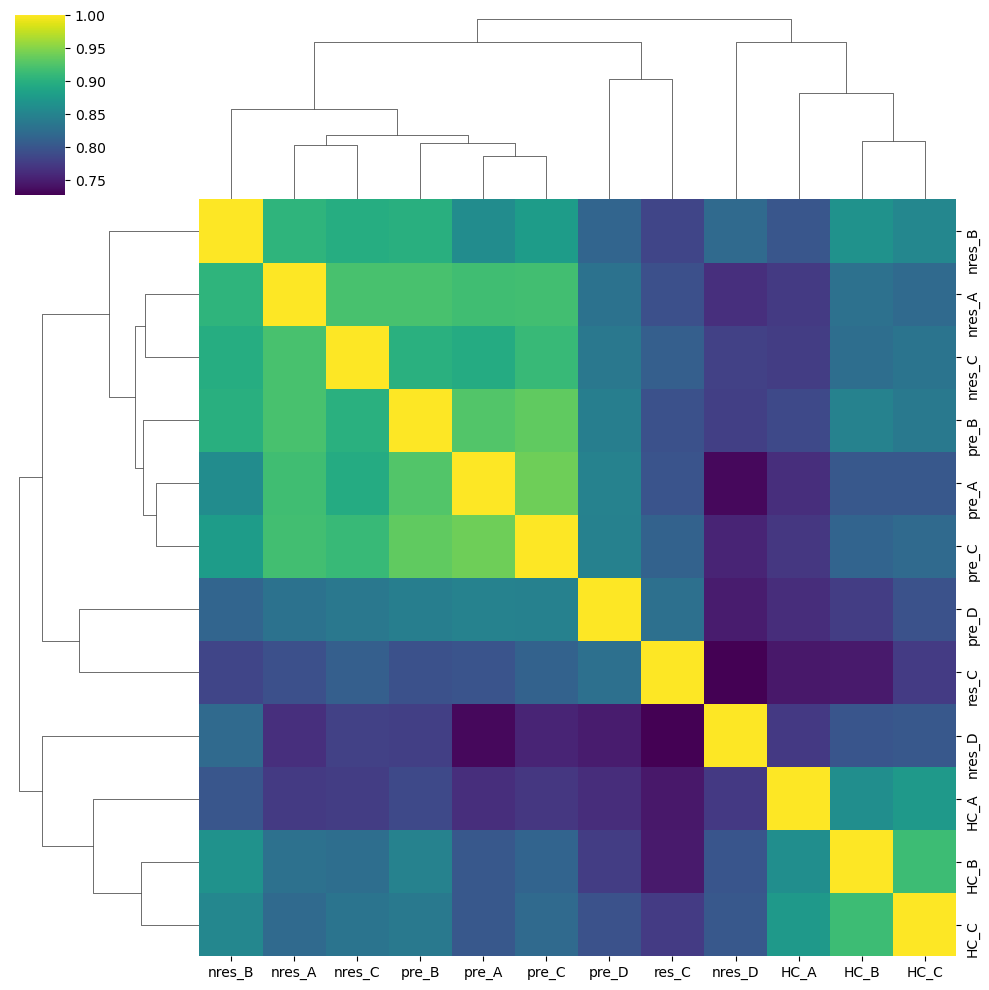

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
sns.clustermap(sim_spearman, cmap="viridis", annot=False)
plt.savefig("similarity_spearman_heatmap.png", dpi=300)


In [58]:
import scanpy as sc
import pandas as pd
import numpy as np

# 你的拆分文件
files = {
    "HC_A": "adata_HC_A.h5ad",
    "HC_B": "adata_HC_B.h5ad",
    "HC_C": "adata_HC_C.h5ad",

    "pre_A": "adata_pre_A.h5ad",
    "pre_B": "adata_pre_B.h5ad",
    "pre_C": "adata_pre_C.h5ad",
    "pre_D": "adata_pre_D.h5ad",

    "res_C": "adata_res_C.h5ad",

    "nres_A": "adata_nres_A.h5ad",
    "nres_B": "adata_nres_B.h5ad",
    "nres_C": "adata_nres_C.h5ad",
    "nres_D": "adata_nres_D.h5ad",
}

adatas = {name: sc.read_h5ad(fn) for name, fn in files.items()}

group_map = {
    "HC": ["HC_A", "HC_B", "HC_C"],
    "Responder": ["pre_A", "pre_B", "pre_C", "pre_D", "res_C"],
    "NonResponder": ["nres_A", "nres_B", "nres_C", "nres_D"],
}


In [59]:
mean_expr = {}

for name, adata in adatas.items():
    X = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
    mean_vec = np.asarray(X.mean(axis=0))
    mean_expr[name] = pd.Series(mean_vec, index=adata.var_names)

# 合并为大矩阵 gene × cluster
df = pd.DataFrame(mean_expr)
df.head()


,HC_A,HC_B,HC_C,pre_A,pre_B,pre_C,pre_D,res_C,nres_A,nres_B,nres_C,nres_D
AL627309.1,0.000000,0.003548,0.007915,0.006013,0.022039,0.024533,0.000000,0.000000,0.005786,0.000000,0.007680,0.000000
AL627309.5,0.024743,0.022180,0.028006,0.008743,0.018496,0.011501,0.010239,0.037405,0.053606,0.016124,0.045197,0.000000
LINC01409,0.013390,0.008667,0.016567,0.086442,0.045912,0.068458,0.051184,0.038920,0.058896,0.037026,0.080604,0.000000
LINC01128,0.028365,0.141670,0.053965,0.043731,0.092764,0.059822,0.065877,0.086661,0.082633,0.115493,0.110427,0.033590
LINC00115,0.045647,0.011533,0.029909,0.009147,0.021503,0.018810,0.000000,0.000000,0.031543,0.010087,0.010149,0.039846


In [60]:
adata_all = adata_result.copy()
sc.pp.highly_variable_genes(adata_all, n_top_genes=2000)
hvg = adata_all.var_names[adata_all.var.highly_variable]


In [61]:
df_hvg = df.loc[hvg.intersection(df.index)]
print(df_hvg.shape)


(2000, 12)


In [62]:
# HC 内部 cluster 相似性
df_hc = df_hvg[group_map["HC"]]
sim_hc = df_hc.corr(method="spearman")

# Responder 内部 cluster 相似性
df_res = df_hvg[group_map["Responder"]]
sim_res = df_res.corr(method="spearman")

# Non-Responder 内部 cluster 相似性
df_nres = df_hvg[group_map["NonResponder"]]
sim_nres = df_nres.corr(method="spearman")

In [63]:
# 三大类之间的跨组相似性

gp = {}

for gname, clist in group_map.items():
    gp[gname] = df_hvg[clist].mean(axis=1)

df_group = pd.DataFrame(gp)
sim_group = df_group.corr(method="spearman")
print(sim_group)


                    HC  Responder  NonResponder
HC            1.000000   0.659563      0.700399
Responder     0.659563   1.000000      0.825837
NonResponder  0.700399   0.825837      1.000000


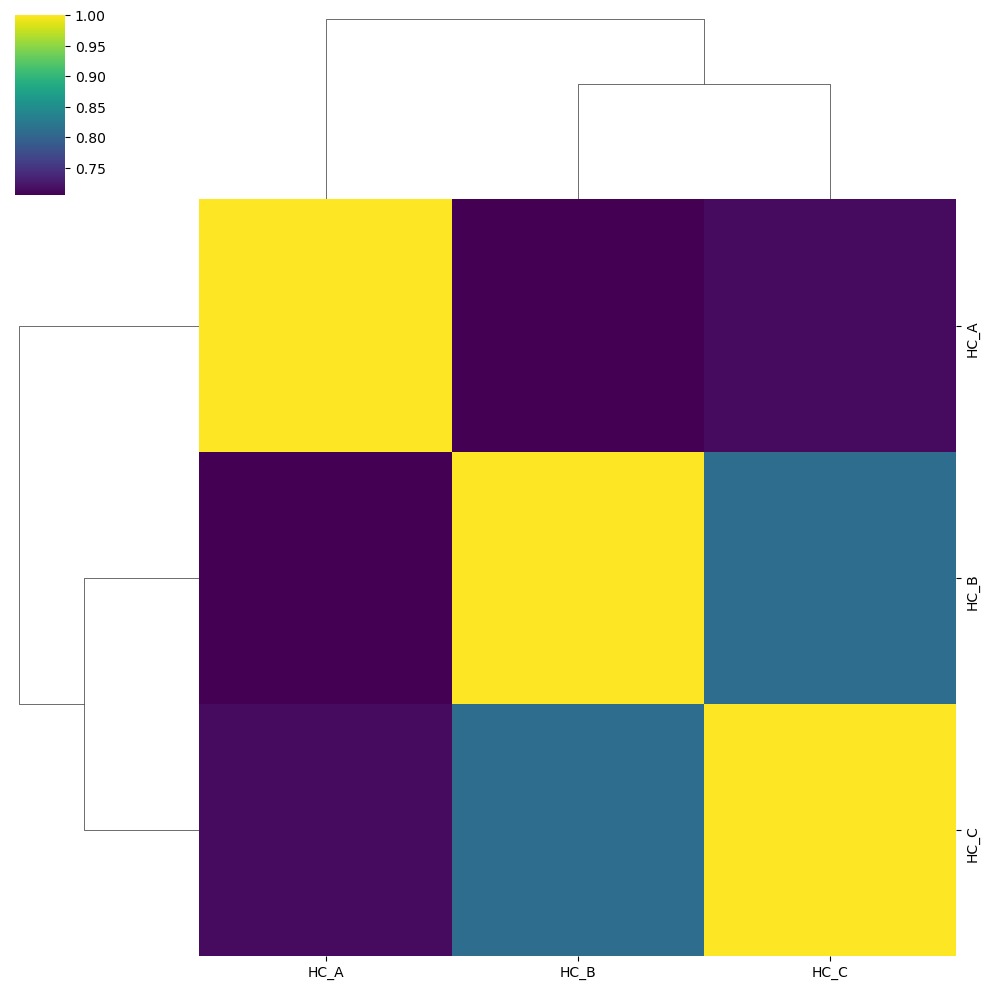

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.clustermap(sim_hc, cmap="viridis")
plt.savefig("sim_hc_heatmap.png", dpi=300)

# sns.clustermap(sim_res, cmap="viridis")
# plt.savefig("sim_res_heatmap.png", dpi=300)

# sns.clustermap(sim_nres, cmap="viridis")
# plt.savefig("sim_nres_heatmap.png", dpi=300)

# sns.clustermap(sim_group, cmap="viridis", annot=True)
# plt.savefig("sim_3groups_heatmap.png", dpi=300)

In [65]:
from scipy.spatial.distance import cosine
from scipy.stats import spearmanr, pearsonr

def compare_two(subset1, subset2, df):
    vec1 = df[subset1]
    vec2 = df[subset2]

    res = {
        "spearman": spearmanr(vec1, vec2).correlation,
        "pearson": pearsonr(vec1, vec2)[0],
        "cosine": 1 - cosine(vec1, vec2)  # similarity
    }
    return res


In [67]:
clusters = list(df_hvg.columns)
similarity_matrix = pd.DataFrame(index=clusters, columns=clusters)

for c1 in clusters:
    for c2 in clusters:
        similarity_matrix.loc[c1, c2] = compare_two(c1, c2, df_hvg)['spearman']

similarity_matrix = similarity_matrix.astype(float)
similarity_matrix.to_csv("pairwise_similarity_spearman.csv")


<Figure size 1000x800 with 0 Axes>

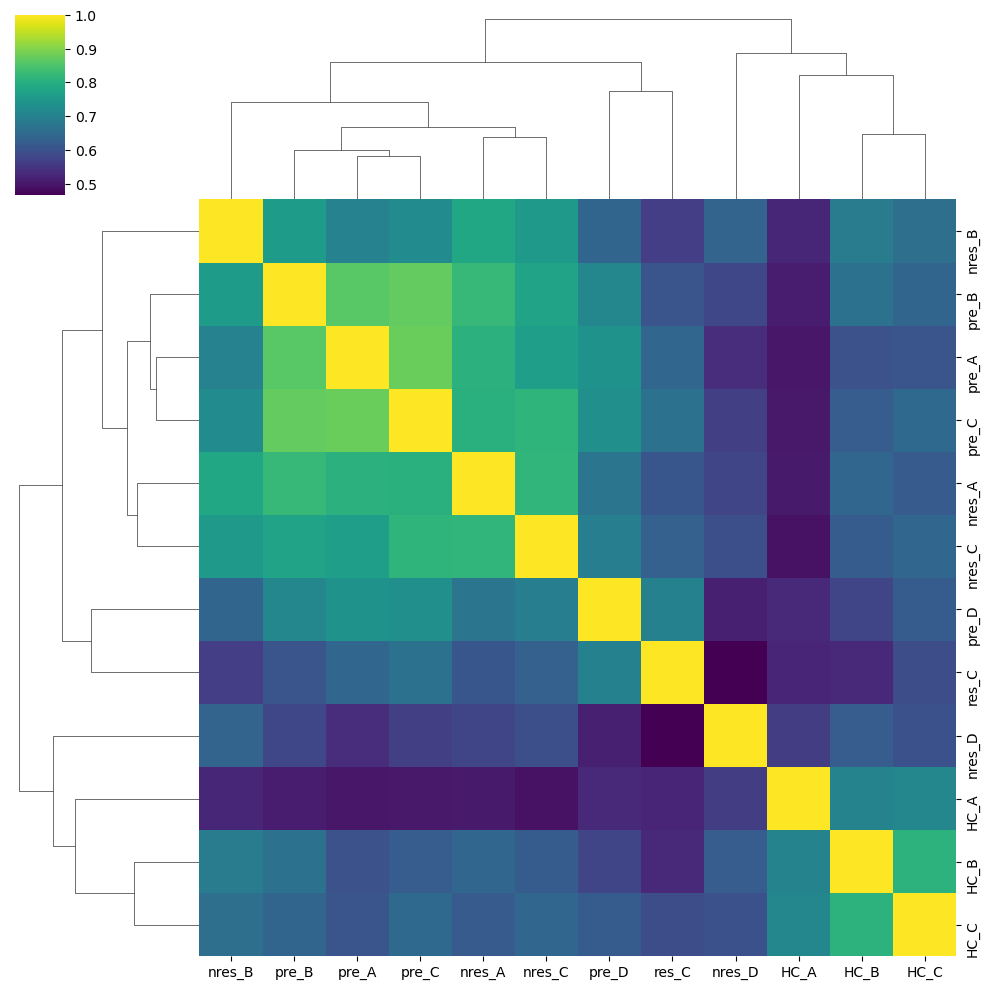

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.clustermap(similarity_matrix, cmap="viridis", annot=False)
plt.savefig("pairwise_cluster_similarity.png", dpi=300)


In [69]:
compare_two("HC_A", "pre_A", df_hvg)


{'spearman': np.float64(0.4984980998920799),
 'pearson': np.float64(0.24243227572491777),
 'cosine': np.float64(0.2958756795927201)}

In [67]:
def main_cluster(
    adata_filter, n_neighbors, embs, resolution,
    threshold_main, threshold_sub, celltype_colors_dict
):
    # 1) Harmony：把结果写到 f"{embs}_harmony"
    #    例：embs="X_pca" -> "X_pca_harmony"
    sce.pp.harmony_integrate(adata_filter, key="patient", basis=embs)
    rep_key = embs
    if rep_key not in adata_filter.obsm:
        raise KeyError(f"Harmony result not found at .obsm['{rep_key}']")

    # 2) 邻居图基于正确的 Harmony 表示
    sc.pp.neighbors(adata_filter, use_rep=rep_key, n_neighbors=n_neighbors)

    # 3) 每次都显式重算 UMAP（而不是让 sc.pl.umap 复用旧 X_umap）
    adata_filter.obsm.pop("X_umap", None)       # 确保不会复用旧图
    sc.tl.umap(adata_filter, random_state=0)    # 可加 init_pos='spectral'

    # 4) 聚类
    sc.tl.leiden(adata_filter, resolution=resolution)

    # 5) 后续你的标注逻辑（保持不变）...
    sc.tl.rank_genes_groups(adata_filter, 'leiden', method='wilcoxon')
    cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()
    cluster_means = (cluster_means - cluster_means.mean()) / cluster_means.std()

    cluster_annotations = {}
    cluster_topN = {}

    for cluster in cluster_means.index:
        lineage_scores = {}
        for lineage, info in hierarchical_markers.items():
            general_markers = [g for g in info["general"] if g in cluster_means.columns]
            if general_markers:
                lineage_scores[lineage] = cluster_means.loc[cluster, general_markers].mean()
        if not lineage_scores:
            cluster_annotations[cluster] = "Unknown"
            continue
        best_lineage, best_lineage_score = max(lineage_scores.items(), key=lambda x: x[1])
        if best_lineage_score < threshold_main:
            cluster_annotations[cluster] = "Unknown"
            continue

        subtype_scores = {}
        subtypes = hierarchical_markers[best_lineage].get("subtypes", {})
        for subtype, markers in subtypes.items():
            m = [g for g in markers if g in cluster_means.columns]
            if m:
                subtype_scores[subtype] = cluster_means.loc[cluster, m].mean()

        if not subtype_scores:
            cluster_annotations[cluster] = best_lineage
        else:
            best_subtype, best_sub_score = max(subtype_scores.items(), key=lambda x: x[1])
            cluster_annotations[cluster] = best_subtype if best_sub_score >= threshold_sub else best_lineage

        cluster_topN[cluster] = {
            "lineage": (best_lineage, best_lineage_score),
            "lineage_scores": lineage_scores,
            "top_subtypes": sorted(subtype_scores.items(), key=lambda x: x[1], reverse=True)[:3],
        }

    adata_filter.obs['celltype'] = adata_filter.obs['leiden'].map(cluster_annotations).astype('category')

    # 颜色同步（防止长度不匹配）
    adata_filter.uns['celltype_colors'] = [
        celltype_colors_dict.get(c, "#CCCCCC")
        for c in adata_filter.obs['celltype'].cat.categories
    ]

    topN_summary = pd.DataFrame({
        k: {
            **{
                f"main_type_{i+1}": (lambda items: items[i][0] if len(items) > i else None)(
                    sorted(v["lineage_scores"].items(), key=lambda x: x[1], reverse=True)
                )
                for i in range(3)
            },
            **{
                f"main_score_{i+1}": (lambda items: items[i][1] if len(items) > i else None)(
                    sorted(v["lineage_scores"].items(), key=lambda x: x[1], reverse=True)
                )
                for i in range(3)
            }
        }
        for k, v in cluster_topN.items()
    }).T

    return adata_filter, cluster_topN, topN_summary


2025-10-30 17:02:43,397 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-10-30 17:02:45,029 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-10-30 17:02:45,114 - harmonypy - INFO - Iteration 1 of 10
2025-10-30 17:02:49,046 - harmonypy - INFO - Iteration 2 of 10
2025-10-30 17:02:52,967 - harmonypy - INFO - Iteration 3 of 10
2025-10-30 17:02:57,021 - harmonypy - INFO - Iteration 4 of 10
2025-10-30 17:02:59,902 - harmonypy - INFO - Iteration 5 of 10
2025-10-30 17:03:02,071 - harmonypy - INFO - Converged after 5 iterations
C:\Users\abdul\AppData\Local\Temp\ipykernel_23208\3519500776.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = adata_filter.to_df().groupby(adata_filter.obs['leiden']).mean()


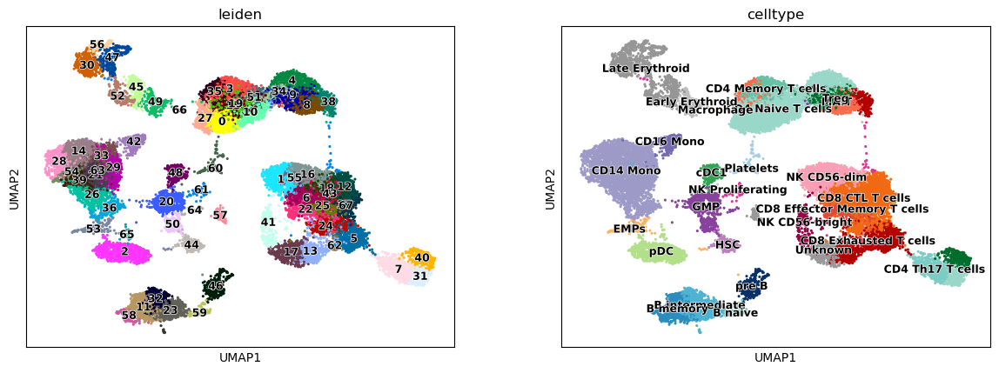

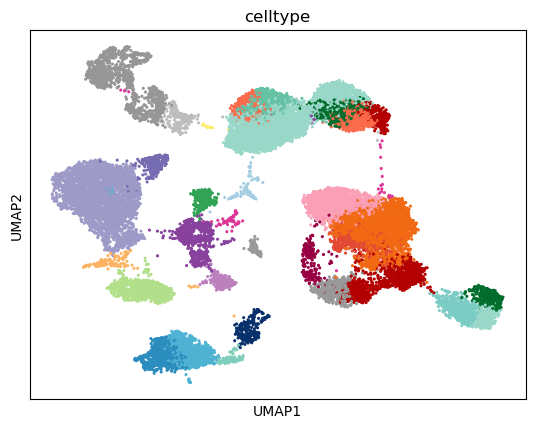

In [68]:
adata_result, cluster_topN, topN_summary = main_cluster(
    adata_filter, n_neighbors, embs, resolution,
    threshold_main, threshold_sub, celltype_colors_dict
)

sc.pl.umap(adata_result, color=['leiden', 'celltype'], legend_loc='on data',
           size=20, legend_fontsize=9, legend_fontoutline=1)
sc.pl.umap(adata_result, color='celltype', legend_loc=None, size=20)


In [21]:
import numpy as np
import pandas as pd
from scipy import sparse
from scipy.stats import ttest_ind, mannwhitneyu

def _get_matrix(adata, layer=None, use_raw=False):
    if use_raw:
        X = adata.raw.X
        var_names = adata.raw.var_names
    elif layer is not None:
        X = adata.layers[layer]
        var_names = adata.var_names
    else:
        X = adata.X
        var_names = adata.var_names
    if sparse.issparse(X):
        X = X.tocsr()
    return X, np.array(var_names)

def _benjamini_hochberg(p):
    p = np.asarray(p)
    n = p.size
    order = np.argsort(p)
    ranks = np.empty_like(order)
    ranks[order] = np.arange(1, n+1)
    adj = p * n / ranks
    # 保证单调
    adj_sorted = np.minimum.accumulate(adj[order][::-1])[::-1]
    out = np.empty_like(adj_sorted)
    out[order] = np.minimum(adj_sorted, 1.0)
    return out

def _looks_like_log1p(X_sample, n_check=5000):
    # 简单启发式：大多数单细胞归一化后范围较小且 >=0
    if sparse.issparse(X_sample):
        X_sample = X_sample.toarray()
    x = X_sample.ravel()
    if x.size > n_check:
        x = np.random.default_rng(0).choice(x, size=n_check, replace=False)
    return (np.nanmin(x) >= 0.0) and (np.nanpercentile(x, 99) < 50)

def find_markers(
    adata,
    groupby: str,
    group1,
    group2=None,
    *,
    layer=None,
    use_raw=False,
    test: str = "wilcoxon",          # "wilcoxon" | "t"
    min_pct: float = 0.1,
    logfc_threshold: float = 0.0,
    only_pos: bool = False,
    equal_var: bool = False,
    alternative: str = "two-sided",  # for wilcoxon (mannwhitneyu)
    return_gene_names: bool = True,
):
    """
    近似 Seurat::FindMarkers 的 Python 实现。
    返回列：p_val, p_val_adj, stat, avg_log2FC, pct_in, pct_out
    行索引为基因名（或 var 索引）。
    """
    obs = adata.obs
    if groupby not in obs:
        raise ValueError(f"`{groupby}` not in adata.obs")

    X, var_names = _get_matrix(adata, layer=layer, use_raw=use_raw)

    g = obs[groupby].values
    idx1 = np.where(g == group1)[0]
    if idx1.size == 0:
        raise ValueError(f"group1 '{group1}' 无细胞")
    if group2 is None:
        idx2 = np.where(g != group1)[0]
    else:
        idx2 = np.where(g == group2)[0]
    if idx2.size == 0:
        raise ValueError(f"对照组无细胞（group2={group2} 或 其余细胞为空）")

    X1 = X[idx1]
    X2 = X[idx2]

    # 稀疏->计算友好
    if sparse.issparse(X1): X1 = X1.tocsr()
    if sparse.issparse(X2): X2 = X2.tocsr()

    # 计算 pct（表达>0 的细胞比例）
    def pct_nonzero(M):
        if sparse.issparse(M):
            nz = (M > 0).astype(np.int8)
            return np.asarray(nz.sum(axis=0)).ravel() / M.shape[0]
        else:
            return (M > 0).mean(axis=0)

    pct1 = pct_nonzero(X1)
    pct2 = pct_nonzero(X2)

    # min_pct 过滤（任一组满足）
    keep = (pct1 >= min_pct) | (pct2 >= min_pct)

    # 组内均值
    def mean_axis0(M):
        if sparse.issparse(M):
            return np.asarray(M.mean(axis=0)).ravel()
        else:
            return M.mean(axis=0)

    mean1 = mean_axis0(X1)
    mean2 = mean_axis0(X2)

    # 判定是否像 log1p 数据
    is_log1p = _looks_like_log1p(X1) and _looks_like_log1p(X2)
    if is_log1p:
        # avg_log2FC = (mean(log1p(x))_1 - mean(log1p(x))_2) / ln(2)
        avg_log2fc = (mean1 - mean2) / np.log(2.0)
    else:
        # 线性尺度 log2((mean1+eps)/(mean2+eps))
        eps = 1e-9
        avg_log2fc = np.log2((mean1 + eps) / (mean2 + eps))

    # logfc 阈值过滤
    if logfc_threshold > 0:
        keep = keep & (np.abs(avg_log2fc) >= logfc_threshold)

    # 统计检验
    pvals = np.full(var_names.shape[0], np.nan, dtype=float)
    stats_arr = np.full_like(pvals, np.nan)

    genes_to_test = np.where(keep)[0]
    # 为了速度，逐基因循环（足够快；超大数据可并行）
    for j in genes_to_test:
        if sparse.issparse(X1):
            a = X1[:, j].toarray().ravel()
            b = X2[:, j].toarray().ravel()
        else:
            a = X1[:, j]
            b = X2[:, j]

        if test == "t":
            stat, p = ttest_ind(a, b, equal_var=equal_var, alternative=alternative)
        elif test == "wilcoxon":
            # Mann-Whitney U (独立样本，近似 Seurat Wilcoxon 行为)
            # scipy >=1.7 支持 alternative 和 method="auto"
            try:
                res = mannwhitneyu(a, b, alternative=alternative, method="auto")
                stat, p = res.statistic, res.pvalue
            except TypeError:
                # 兼容旧版 SciPy
                stat, p = mannwhitneyu(a, b, alternative=alternative)
        else:
            raise ValueError("test 仅支持 'wilcoxon' 或 't'")

        pvals[j] = p
        stats_arr[j] = stat

    # only.pos：仅保留上调（avg_log2FC > 0）
    if only_pos:
        keep = keep & (avg_log2fc > 0)

    kept_idx = np.where(keep & np.isfinite(pvals))[0]
    if kept_idx.size == 0:
        return pd.DataFrame(columns=[
            "p_val","p_val_adj","stat","avg_log2FC","pct_in","pct_out"
        ])

    padj = np.full_like(pvals, np.nan)
    padj[kept_idx] = _benjamini_hochberg(pvals[kept_idx])

    out = pd.DataFrame({
        "p_val": pvals[kept_idx],
        "p_val_adj": padj[kept_idx],
        "stat": stats_arr[kept_idx],
        "avg_log2FC": avg_log2fc[kept_idx],
        "pct_in": pct1[kept_idx],
        "pct_out": pct2[kept_idx],
    }, index=(var_names[kept_idx] if return_gene_names else kept_idx))

    # 排序：先按 p_val_adj，再按 |avg_log2FC|（only_pos 时降序）
    if only_pos:
        out = out.sort_values(["p_val_adj", "avg_log2FC"], ascending=[True, False])
    else:
        out = out.sort_values(["p_val_adj", "avg_log2FC"], ascending=[True, False])
    return out


In [25]:
# 假设已有 adata（log1p 归一化后的表达矩阵），并在 adata.obs['louvain'] 有簇信息
res = find_markers(
    adata_result,
    groupby="celltype",
    group1="Late Erythroid",             # 目标簇
    group2=None,            # 与其余细胞比较（Seurat 默认）
    test="wilcoxon",        # 或 "t"
    min_pct=0.1,
    logfc_threshold=0.25,   # 近似 Seurat 常用阈值
    only_pos=False,
    use_raw=False,          # 若想用 adata.raw 则设 True
    layer=None              # 或填某个 layer 名
)
res.head(20)


,p_val,p_val_adj,stat,avg_log2FC,pct_in,pct_out
HBB,0.0,0.0,101767969.0,8.098404,0.969926,0.397028
HBA2,0.0,0.0,100161960.5,6.126893,0.924501,0.149606
HBA1,0.0,0.0,100123769.0,5.875045,0.922818,0.127764
SLC25A37,0.0,0.0,100318603.5,4.736057,0.925973,0.176177
SLC4A1,0.0,0.0,96927962.0,3.911075,0.848791,0.033596
HBD,0.0,0.0,89147034.5,3.442834,0.718191,0.047827
CA1,0.0,0.0,88698012.0,3.349914,0.718612,0.066922
AHSP,0.0,0.0,88689455.0,3.216377,0.712934,0.053997
ANK1,0.0,0.0,90839913.5,3.085954,0.745531,0.050529
BLVRB,0.0,0.0,90780146.5,2.799709,0.772450,0.109705


In [ ]:
import scanpy as sc
import celltypist

# # 查看可用模型
celltypist.models.models_description()

# # 下载并加载模型（返回路径）
# model_path = celltypist.models.download_models('Immune_All_High')

# 1) 逐细胞预测（不做 majority voting）
# adata_ctrl = adata[adata.obs["treat"] == "control"].copy()
pred_ctrl = celltypist.annotate(
    adata_ctrl,
    model='Immune_All_Low.pkl',   # 或你的自训模型路径
    majority_voting=False
)
adata_ctrl.obs['celltypist'] = pred_ctrl.predicted_labels

# pred_aml = celltypist.annotate(
#     adata_aml,
#     model='Immune_All_High',
#     majority_voting=False
# )
# adata_aml.obs['celltypist'] = pred_aml.predicted_labels

# 2) 若想“按簇平滑”，用你自己算的簇来投票（示例）
# sc.pp.normalize_total(adata_aml); sc.pp.log1p(adata_aml)
# sc.pp.highly_variable_genes(adata_aml); sc.tl.pca(adata_aml)
# sc.pp.neighbors(adata_aml); sc.tl.leiden(adata_aml, resolution=1.0)

# # 对每个簇取众数作为簇标签
# cluster_major = (
#     adata_aml.obs.groupby('leiden')['celltypist']
#     .agg(lambda x: x.value_counts().idxmax())
# )
# adata_aml.obs['celltypist_mv'] = adata_aml.obs['leiden'].map(cluster_major)



👉 Detailed model information can be found at `https://www.celltypist.org/models`
⚠️ Warning: invalid expression matrix, expect ALL genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 22681 cells and 27187 genes
🔗 Matching reference genes in the model
🧬 5893 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


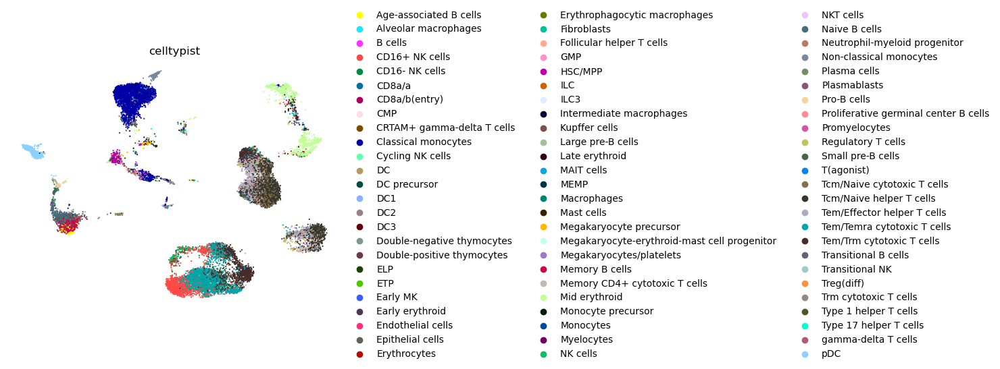

In [ ]:


# if 'X_umap' not in adata_ctrl.obsm_keys():
#     sc.pp.normalize_total(adata_ctrl); sc.pp.log1p(adata_ctrl)
#     sc.pp.highly_variable_genes(adata_ctrl)
#     sc.tl.pca(adata_ctrl); sc.pp.neighbors(adata_ctrl); sc.tl.umap(adata_ctrl)

sc.pl.umap(adata_ctrl, color='celltypist', legend_loc='right margin', frameon=False, s=10)


In [ ]:

# 统计每个 Leiden cluster 中的 celltypist 注释
cluster_celltypes = (
    adata_ctrl.obs.groupby("leiden")["celltypist"]
    .agg(lambda x: x.value_counts().index[0])  # 多数表决
)

print(cluster_celltypes)

adata_ctrl.obs["celltypist_cluster"] = adata_ctrl.obs["leiden"].map(cluster_celltypes)

leiden
0     Tem/Temra cytotoxic T cells
1        Tcm/Naive helper T cells
2             Classical monocytes
3     Tem/Effector helper T cells
4                   Naive B cells
5       Tem/Trm cytotoxic T cells
6        Tcm/Naive helper T cells
7       Tem/Trm cytotoxic T cells
8             Classical monocytes
9                             pDC
10                  Mid erythroid
11                  Mid erythroid
12            Classical monocytes
13        Non-classical monocytes
14              Small pre-B cells
15                        HSC/MPP
16                   Plasma cells
17       Megakaryocytes/platelets
Name: celltypist, dtype: category
Categories (75, object): ['Age-associated B cells', 'Alveolar macrophages', 'B cells', 'CD16+ NK cells', ..., 'Type 1 helper T cells', 'Type 17 helper T cells', 'gamma-delta T cells', 'pDC']


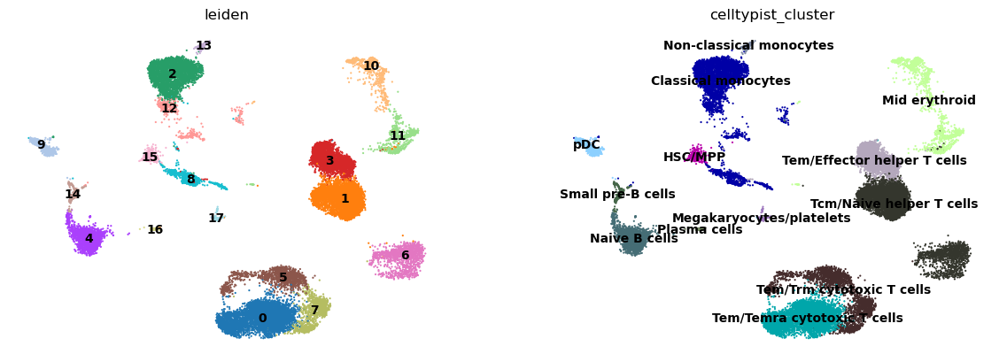

In [ ]:
sc.pl.umap(
    adata_ctrl, 
    color=["leiden", "celltypist_cluster"], 
    legend_loc="on data", 
    frameon=False, 
    s=10
)


In [ ]:

# 统计每个 Leiden cluster 中的 celltypist 注释
cluster_azimuth = (
    adata_ctrl.obs.groupby("leiden")["azimuthNames"]
    .agg(lambda x: x.value_counts().index[0])  # 多数表决
)

print(cluster_azimuth )

adata_ctrl.obs["azimuthNames_cluster"] = adata_ctrl.obs["leiden"].map(cluster_azimuth)

leiden
0     CD8 Effector_2
1         CD4 Memory
2          CD14 Mono
3         CD4 Memory
4            Naive B
5     CD8 Effector_2
6         CD4 Memory
7     CD8 Effector_1
8                GMP
9                pDC
10        Late Eryth
11        Late Eryth
12         CD14 Mono
13         CD16 Mono
14    transitional B
15               HSC
16            Plasma
17          Platelet
Name: azimuthNames, dtype: category
Categories (40, object): ['ASDC', 'BaEoMa', 'CD4 Effector', 'CD4 Memory', ..., 'pre-mDC', 'pre-pDC', 'pro B', 'transitional B']


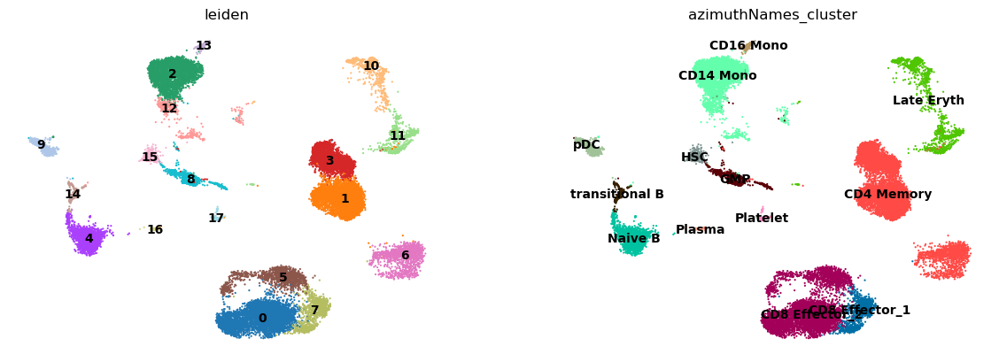

In [ ]:
sc.pl.umap(
    adata_ctrl, 
    color=["leiden", "azimuthNames_cluster"], 
    legend_loc="on data", 
    frameon=False, 
    s=10
)


In [ ]:
cluster_azimuth

leiden
0     CD8 Effector_2
1         CD4 Memory
2          CD14 Mono
3         CD4 Memory
4            Naive B
5     CD8 Effector_2
6         CD4 Memory
7     CD8 Effector_1
8                GMP
9                pDC
10        Late Eryth
11        Late Eryth
12         CD14 Mono
13         CD16 Mono
14    transitional B
15               HSC
16            Plasma
17          Platelet
Name: azimuthNames, dtype: category
Categories (40, object): ['ASDC', 'BaEoMa', 'CD4 Effector', 'CD4 Memory', ..., 'pre-mDC', 'pre-pDC', 'pro B', 'transitional B']